In [ ]:
#!/usr/bin/env python3.6
# -*- coding: utf-8 -*-

In [ ]:
# Imports
import sys
import math
import numpy as np
from matplotlib import animation
from IPython.display import HTML
from matplotlib import pyplot as plt
plt.rcParams['animation.ffmpeg_path'] = '/usr/bin/ffmpeg'
import mpl_toolkits.mplot3d.axes3d as p3

In [2]:
np.random.seed(20)
np.set_printoptions(threshold=sys.maxsize)

In [3]:
%matplotlib inline

# Data

In [4]:
# Read data
motion = np.genfromtxt('../dataset3/motion_tf_complete.csv', delimiter=',', dtype=np.float64)
print("Motion data has a length of ", len(motion))

Motion data has a length of  464053


In [5]:
motion.shape

(464053, 45)

## Visualizations

In [6]:
"""
    Plot a 4x2 grid of comparing data.
"""
def plot_non_overlapping_data(dataset, data:list, idxs: list):
    fig, ((ax1, ax2), (ax3, ax4), (ax5, ax6), (ax7, ax8)) = plt.subplots(4,2, figsize=(20,15))
    fig.suptitle('Heigh-Force (Idle)')

    ax1.plot(dataset[data[0], 0], dataset[data[0], idxs[0]], 'b-')
    ax1.set_xlabel('Time')
    ax1.set_ylabel('Height (FL)')

    ax2.plot(dataset[data[0], 0], dataset[data[0], idxs[1]], 'g-')
    ax2.set_xlabel('Time')
    ax2.set_ylabel('Force (FL)')

    ax3.plot(dataset[data[1], 0], dataset[data[1], idxs[2]], 'b-')
    ax3.set_xlabel('Time')
    ax3.set_ylabel('Height (FR)')

    ax4.plot(dataset[data[1], 0], dataset[data[1], idxs[3]], 'g-')
    ax4.set_xlabel('Time')
    ax4.set_ylabel('Force (FR)')

    ax5.plot(dataset[data[2], 0], dataset[data[2], idxs[4]], 'b-')
    ax5.set_xlabel('Time')
    ax5.set_ylabel('Height (RL)')

    ax6.plot(dataset[data[2], 0], datasetD[data[2], idxs[5]], 'g-')
    ax6.set_xlabel('Time')
    ax6.set_ylabel('Force (RL)')

    ax7.plot(dataset[data[3], 0], dataset[data[3], idxs[6]], 'b-')
    ax7.set_xlabel('Time')
    ax7.set_ylabel('Height (RR)')

    ax8.plot(dataset[data[3], 0], dataset[data[3], idxs[7]], 'g-')
    ax8.set_xlabel('Time')
    ax8.set_ylabel('Force (RR)')

    fig.tight_layout()

    plt.show()
 
"""
    Plot data on overlapping graph. 
"""
def plot_overlapping_data(title: str, dataset, data: list, idxs: list, draw_footsteps=None, footsteps_timestamp=None):
    fig, (ax1, ax3, ax5, ax7) = plt.subplots(4,1, figsize=(20,15))
    fig.suptitle(title)
    
    # FL plot (height)
    ax1.plot(dataset[data[0], 0], dataset[data[0], idxs[0]], 'b-')
    ax1.set_ylabel('Height (FL)', color='b')
    ax1.set_xlabel('Time')
         
    # FL plot (force)
    ax2 = ax1.twinx()
    ax2.plot(dataset[data[0], 0], dataset[data[0], idxs[1]], 'g-')
    ax2.set_ylabel('Force (FL)', color='g')
          
    # FR plot (height)
    ax3.plot(dataset[data[1], 0], dataset[data[1], idxs[2]], 'b-')
    ax3.set_ylabel('Height (FR)', color='b')
    ax3.set_xlabel('Time')
         
    # FR plot (force)
    ax4 = ax3.twinx()
    ax4.plot(dataset[data[1], 0], dataset[data[1], idxs[3]], 'g-')
    ax4.set_ylabel('Force(FR)', color='g')      
          
    # RL plot (height)
    ax5.plot(dataset[data[2], 0], dataset[data[2], idxs[4]], 'b-')
    ax5.set_ylabel('Height (RL)', color='b')
    ax5.set_xlabel('Time')
         
    # RL plot (force)
    ax6 = ax5.twinx()
    ax6.plot(dataset[data[2], 0], dataset[data[2], idxs[5]], 'g-')
    ax6.set_ylabel('Force (RL)', color='g')   
          
    # RR plot (height)
    ax7.plot(dataset[data[3], 0], dataset[data[3], idxs[6]], 'b-')
    ax7.set_ylabel('Height (RR)', color='b')
    ax7.set_xlabel('Time')
         
    # RR plot (force)
    ax8 = ax7.twinx()
    ax8.plot(dataset[data[3], 0], dataset[data[3], idxs[7]], 'g-')
    ax8.set_ylabel('Force (RR)', color='g')

    for ax in [ax2, ax4, ax6, ax8]:
        for tl in ax.get_yticklabels():
            tl.set_color('g')
    
    for ax in [ax1, ax3, ax5, ax7]:
        for tl in ax.get_yticklabels():
            tl.set_color('b')
    
    # Draw footsteps
    if draw_footsteps:
        for ax in [ax1, ax3, ax5, ax7]:
            for footstep_timestamp in footsteps_timestamp:
                if footstep_timestamp <= max(dataset[data[0], 0]) and footstep_timestamp >= min(dataset[data[0], 0]):
                    #print("Timestamp: ", footstep_timestamp)
                    ax.axvline(x=footstep_timestamp, color='r', linestyle='-')
                    #ax.axvline(x=footstep_timestamp+0.15, color='b', linestyle='-')
    
    fig.tight_layout()
    plt.show()

## Height-Force plots

In [7]:
def get_specific_cmd(dataset, fwd, side, rot):
    if abs(fwd): 
        return np.where(dataset[:, 1] > 0)[0] if fwd > 0 else np.where(dataset[:, 1] < 0)[0]
    if abs(side): 
        return np.where(dataset[:, 2] > 0)[0] if side > 0 else np.where(dataset[:, 2] < 0)[0]
    if abs(rot): 
        return np.where(dataset[:, 6] > 0)[0] if rot > 0 else np.where(dataset[:, 6] < 0)[0]

In [8]:
def get_swinging_motions(dataset, height=-0.1):
    # FR min height (i.e swining motion)
    fr_min_height = np.where(dataset[:, 9] < height)[0]
    fl_min_height = np.where(dataset[:, 12] < height)[0]
    rr_min_height = np.where(dataset[:, 15] < height)[0]
    rl_min_height = np.where(dataset[:, 18] < height)[0]
            
    return fr_min_height,fl_min_height,rr_min_height,rl_min_height

## motion

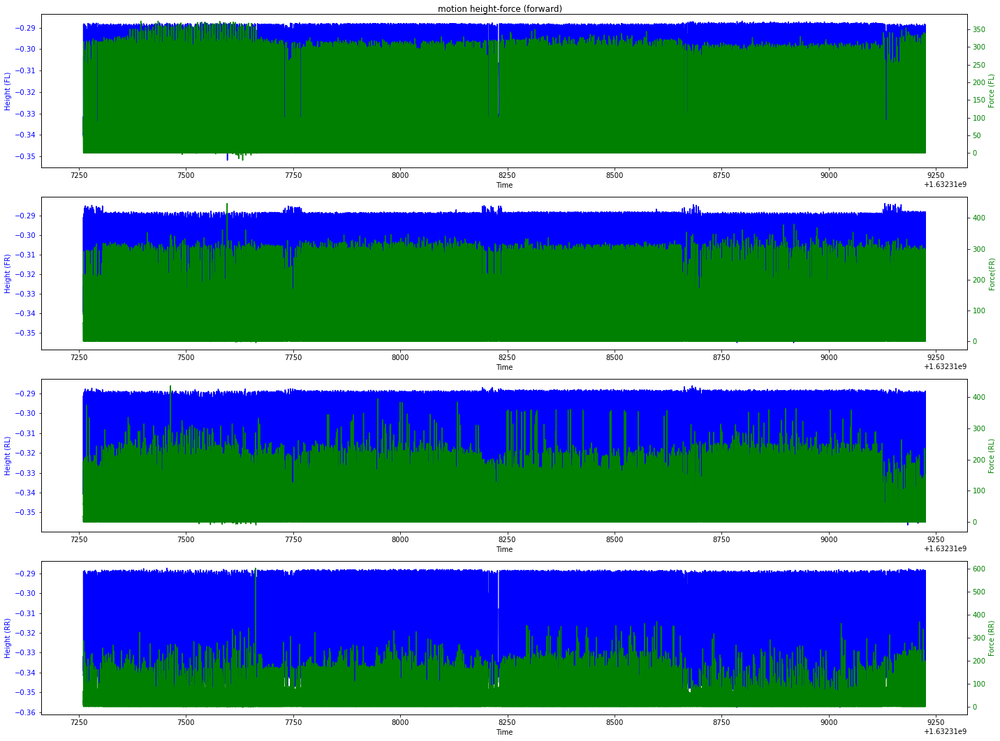

In [9]:
# Forward
fwd_cmds = get_specific_cmd(motion, 1, 0, 0)
motion_fwd = motion[fwd_cmds]
fr_min_height,fl_min_height,rr_min_height,rl_min_height = get_swinging_motions(motion_fwd)

sample_walking_fr_height = fr_min_height
sample_walking_fl_height = fl_min_height
sample_walking_rr_height = rr_min_height
sample_walking_rl_height = rl_min_height

plot_overlapping_data("motion height-force (forward)",
                      motion,
                      [sample_walking_fr_height, 
                       sample_walking_fl_height, 
                       sample_walking_rr_height,
                       sample_walking_rl_height],
                       [9, 21, 12, 24, 15, 27, 18, 30])

In [10]:
"""
# Backwards
bwd_cmds = get_specific_cmd(motion, -velocity, 0, 0)
motion_bwd = motion[bwd_cmds]
fr_min_height,fl_min_height,rr_min_height,rl_min_height = get_swinging_motions(motion_bwd)

sample_walking_fr_height = fr_min_height
sample_walking_fl_height = fl_min_height
sample_walking_rr_height = rr_min_height
sample_walking_rl_height = rl_min_height

plot_overlapping_data("motion height-force (backward)",
                      motion,
                      [sample_walking_fr_height, 
                       sample_walking_fl_height, 
                       sample_walking_rr_height,
                       sample_walking_rl_height],
                       [9, 21, 12, 24, 15, 27, 18, 30])
"""

'\n# Backwards\nbwd_cmds = get_specific_cmd(motion, -velocity, 0, 0)\nmotion_bwd = motion[bwd_cmds]\nfr_min_height,fl_min_height,rr_min_height,rl_min_height = get_swinging_motions(motion_bwd)\n\nsample_walking_fr_height = fr_min_height\nsample_walking_fl_height = fl_min_height\nsample_walking_rr_height = rr_min_height\nsample_walking_rl_height = rl_min_height\n\nplot_overlapping_data("motion height-force (backward)",\n                      motion,\n                      [sample_walking_fr_height, \n                       sample_walking_fl_height, \n                       sample_walking_rr_height,\n                       sample_walking_rl_height],\n                       [9, 21, 12, 24, 15, 27, 18, 30])\n'

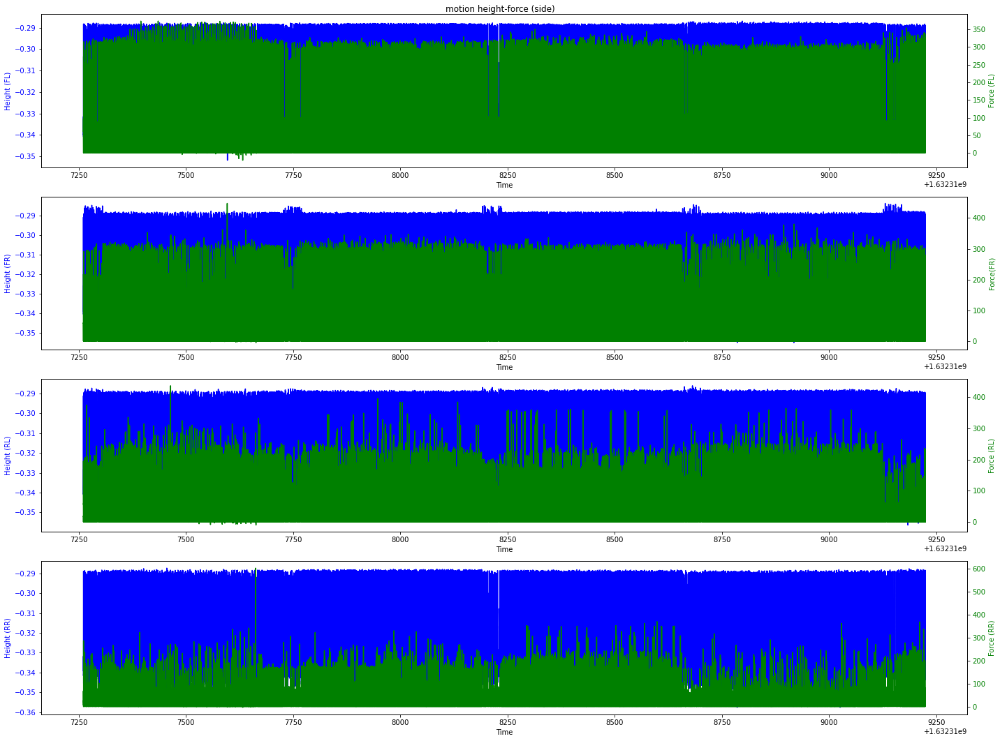

In [11]:
# Side (right)
side_cmds = get_specific_cmd(motion, 0, -1, 0)
motion_side = motion[side_cmds]
fr_min_height,fl_min_height,rr_min_height,rl_min_height = get_swinging_motions(motion_side)

sample_walking_fr_height = fr_min_height
sample_walking_fl_height = fl_min_height
sample_walking_rr_height = rr_min_height
sample_walking_rl_height = rl_min_height

plot_overlapping_data("motion height-force (side)",
                      motion,
                      [sample_walking_fr_height, 
                       sample_walking_fl_height, 
                       sample_walking_rr_height,
                       sample_walking_rl_height],
                       [9, 21, 12, 24, 15, 27, 18, 30])

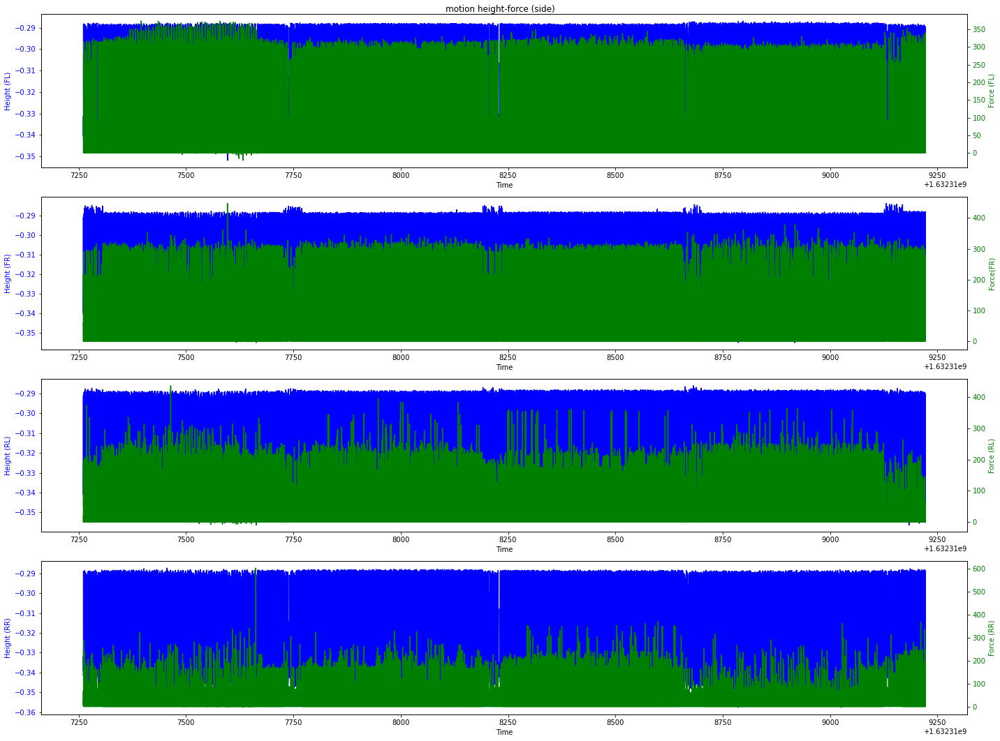

In [12]:
# Side (left)
side_cmds = get_specific_cmd(motion, 0, 1, 0)
motion_side = motion[side_cmds]
fr_min_height,fl_min_height,rr_min_height,rl_min_height = get_swinging_motions(motion_side)

sample_walking_fr_height = fr_min_height
sample_walking_fl_height = fl_min_height
sample_walking_rr_height = rr_min_height
sample_walking_rl_height = rl_min_height

plot_overlapping_data("motion height-force (side)",
                      motion,
                      [sample_walking_fr_height, 
                       sample_walking_fl_height, 
                       sample_walking_rr_height,
                       sample_walking_rl_height],
                       [9, 21, 12, 24, 15, 27, 18, 30])

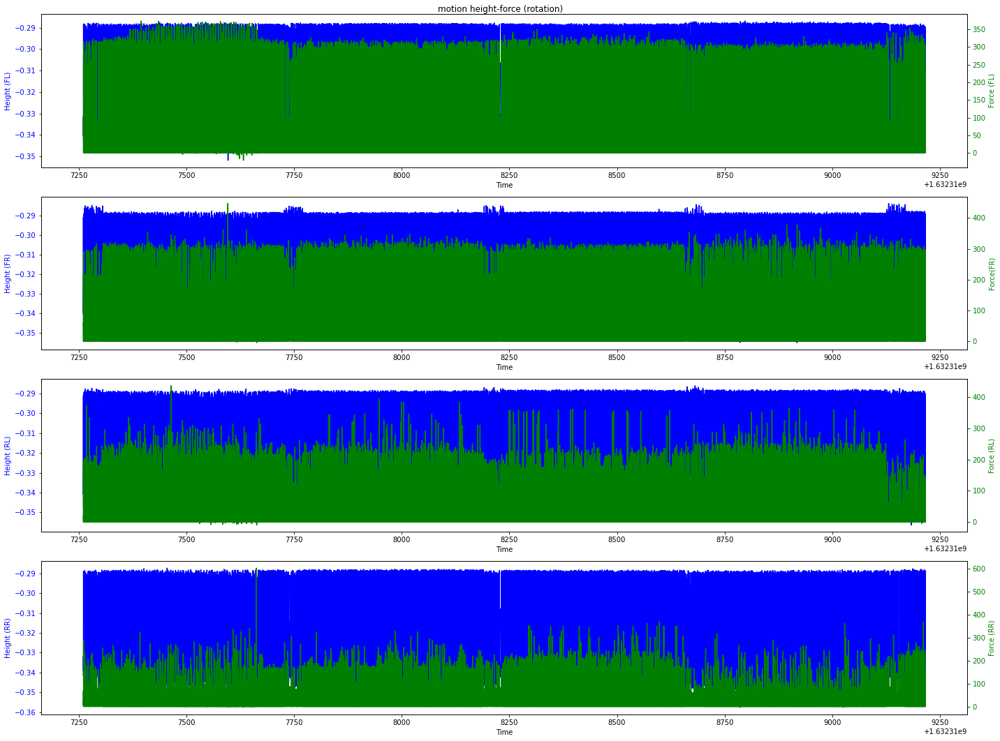

In [13]:
# Rotation (clockwise)
rot_cmds = get_specific_cmd(motion, 0, 0, -1)
motion_rot = motion[rot_cmds]
fr_min_height,fl_min_height,rr_min_height,rl_min_height = get_swinging_motions(motion_rot)

sample_walking_fr_height = fr_min_height
sample_walking_fl_height = fl_min_height
sample_walking_rr_height = rr_min_height
sample_walking_rl_height = rl_min_height

plot_overlapping_data("motion height-force (rotation)",
                      motion,
                      [sample_walking_fr_height, 
                       sample_walking_fl_height, 
                       sample_walking_rr_height,
                       sample_walking_rl_height],
                       [9, 21, 12, 24, 15, 27, 18, 30])

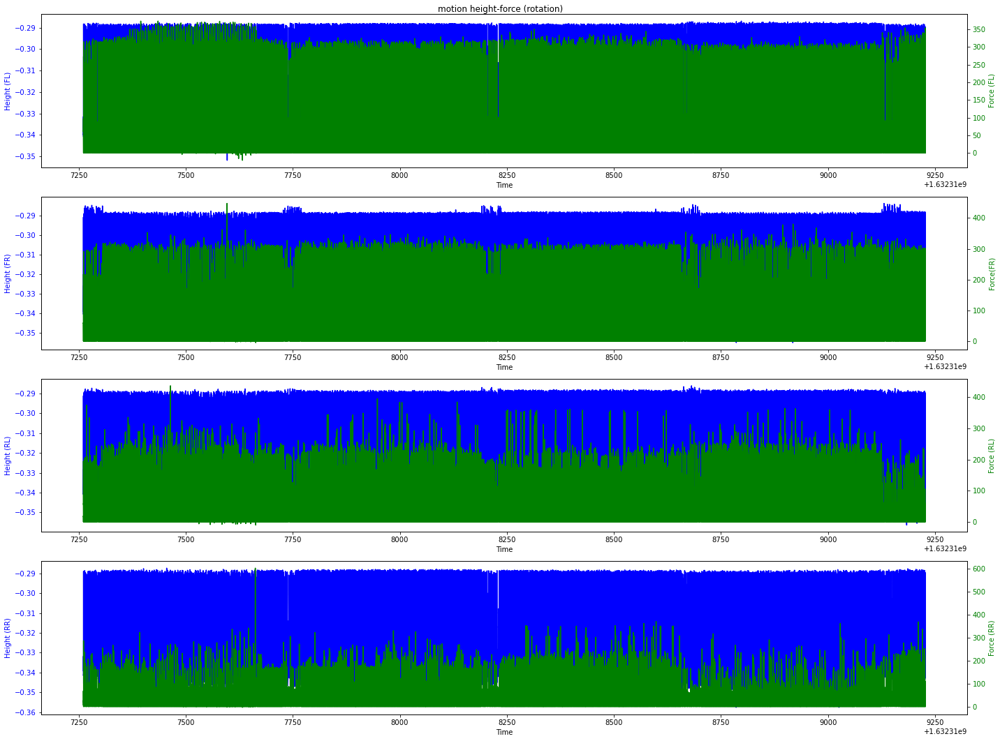

In [14]:
# Rotation (counter clockwise)
rot_cmds = get_specific_cmd(motion, 0, 0, 1)
motion_rot = motion[rot_cmds]
fr_min_height,fl_min_height,rr_min_height,rl_min_height = get_swinging_motions(motion_rot)

sample_walking_fr_height = fr_min_height
sample_walking_fl_height = fl_min_height
sample_walking_rr_height = rr_min_height
sample_walking_rl_height = rl_min_height

plot_overlapping_data("motion height-force (rotation)",
                      motion,
                      [sample_walking_fr_height, 
                       sample_walking_fl_height, 
                       sample_walking_rr_height,
                       sample_walking_rl_height],
                       [9, 21, 12, 24, 15, 27, 18, 30])

## Footsteps Extraction (Height + Force)

In [15]:
"""
    Extract footsteps from raw data using
    force and height measurements together.
"""
def extract_footsteps(dataset, height_threshold=0.1, force_thresholds=[100,100,100,100]):
    # Compute height difference for FR and FL
    fr_fl_diff = np.round(abs(dataset[:, 9] - dataset[:, 12]), 9)
    print("Max diff between fr and fl: ", max(fr_fl_diff))

    # Compute height difference for RR and RL
    rr_rl_diff = np.round(abs(dataset[:, 15] - dataset[:, 18]), 9)
    print("Max diff between rr and rl: ", max(rr_rl_diff))

    # Compute compound difference for all foots
    height_diff = np.round(fr_fl_diff + rr_rl_diff, 9)
    print("Min and max diff between front and rear feet", min(height_diff), max(height_diff), "\n")
    
    # Find footsteps (based on height difference)
    footsteps_height = np.where(height_diff < height_threshold)[0]
    print("Amount of footsteps found with height criteria: ", len(footsteps_height), "\n")
    
    # Find footsteps based on force perceived
    rear_force_footsteps = np.where(np.logical_or(dataset[:, 21] <= force_thresholds[0], dataset[:, 24] <= force_thresholds[1]))[0]
    front_force_footsteps = np.where(np.logical_or(dataset[:, 27] <= force_thresholds[2], dataset[:, 30] <= force_thresholds[3]))[0]
    
    # Find footsteps that match force constraints on all foot
    footsteps_force = np.intersect1d(rear_force_footsteps, front_force_footsteps)
    print("Number of force footsteps: ", len(footsteps_force), "\n")
    
    # Find force and height footsteps intersection
    force_height_footsteps = np.intersect1d(footsteps_force, footsteps_height)
    print("Number of height-force footsteps: ", len(force_height_footsteps), "\n")
    
    return force_height_footsteps


"""
    Perform non-maximum-suppresion on the 
    footsteps found as multiple instances
    are found within a small time window.
"""
def footsteps_nms(dataset, footsteps):
    footsteps_nms = []

    idx = 0
    footstep_to_add = footsteps[0]
    
    # Iterate over the footsteps
    while idx < (len(footsteps) - 1):
        # Compute time difference between
        # current and next footsteps
        time_difference = abs(dataset[footsteps[idx], 0] - dataset[footsteps[idx+1], 0])
        
        # Find corresponding index in between
        # the current and next footsteps
        time_differences = np.abs(dataset[:, 0] - (dataset[footsteps[idx], 0] + time_difference/2))
        matching_index = time_differences.argmin()
        
        # Retrieve what is the maximum height
        # reached in between the current and
        # next footstep
        height_peek_in_between = max([dataset[matching_index, x] for x in [9, 12, 15, 18]])
        
        # Within same time window but not consecute footsteps
        if time_difference < 0.1 and not height_peek_in_between > -0.31:
            # Compute height difference between feet
            #height_diff_idx = abs(dataset[footsteps[idx], 9] - dataset[footsteps[idx], 12]) + abs(dataset[footsteps[idx], 15] - dataset[footsteps[idx], 18])
            #height_diff_idx_next = abs(dataset[footsteps[idx+1], 9] - dataset[footsteps[idx+1], 12]) + abs(dataset[footsteps[idx+1], 15] - dataset[footsteps[idx+1], 18])
                
            # Choose foot with lowest height difference
            #footstep_to_add = footsteps[idx] if height_diff_idx < height_diff_idx_next else footsteps[idx+1]
            #timestamp_of_footstep_to_add = dataset[footsteps[idx], 0] if height_diff_idx < height_diff_idx_next else dataset[footsteps[idx+1], 0] 
            
            footstep_to_add = footsteps[idx] if dataset[footsteps[idx], 0] < dataset[footsteps[idx+1], 0] else footsteps[idx+1]
        elif time_difference < 0.1 and height_peek_in_between > -0.31:
            footsteps_nms.append(footstep_to_add)
        elif time_difference > 0.1:
            footsteps_nms.append(footstep_to_add)
        
        idx += 1
        
    return np.asarray(footsteps_nms)

## Footsteps

In [21]:
def footstep_extraction_and_plotting(dataset, velocities, height_threshold, force_thresholds, indexes):
    # Extract backward motion entries
    cmds = get_specific_cmd(dataset, velocities[0], velocities[1], velocities[2])
    motion_cmds = motion[cmds]
    fr_min_height, fl_min_height, rr_min_height, rl_min_height = get_swinging_motions(motion_cmds)
    print("Foot swinging motions lenghts: ", len(fr_min_height), len(fl_min_height), len(rr_min_height), len(rl_min_height))
    
    # Extract footsteps
    footsteps = extract_footsteps(motion_cmds, height_threshold, force_thresholds)
    print("Footsteps extracted: ", len(footsteps))
    
    # Footsteps NMS
    footsteps_after_nms = footsteps_nms(motion_cmds, footsteps)
    print("Footsteps after non-maximum-suppression: ", len(footsteps_after_nms))
    
    # Plot footsteps
    sample_walking_fr_height = fr_min_height[indexes]
    sample_walking_fl_height = fl_min_height[indexes]
    sample_walking_rr_height = rr_min_height[indexes]
    sample_walking_rl_height = rl_min_height[indexes]

    plot_overlapping_data("Footsteps",
                          motion_cmds,
                          [sample_walking_fr_height, 
                           sample_walking_fl_height, 
                           sample_walking_rr_height,
                           sample_walking_rl_height],
                           [9, 21, 12, 24, 15, 27, 18, 30],
                           True,
                           motion_cmds[footsteps_nms(motion_cmds, footsteps), 0])
                           #motion_cmds[footsteps, 0])
 
    return motion_cmds, footsteps_after_nms

### Forward motion

Foot swinging motions lenghts:  92917 92917 92917 92917
Max diff between fr and fl:  0.049927801
Max diff between rr and rl:  0.051677674
Min and max diff between front and rear feet 1.1772e-05 0.100870937 

Amount of footsteps found with height criteria:  38408 

Number of force footsteps:  92855 

Number of height-force footsteps:  38404 

Footsteps extracted:  38404
Footsteps after non-maximum-suppression:  5742


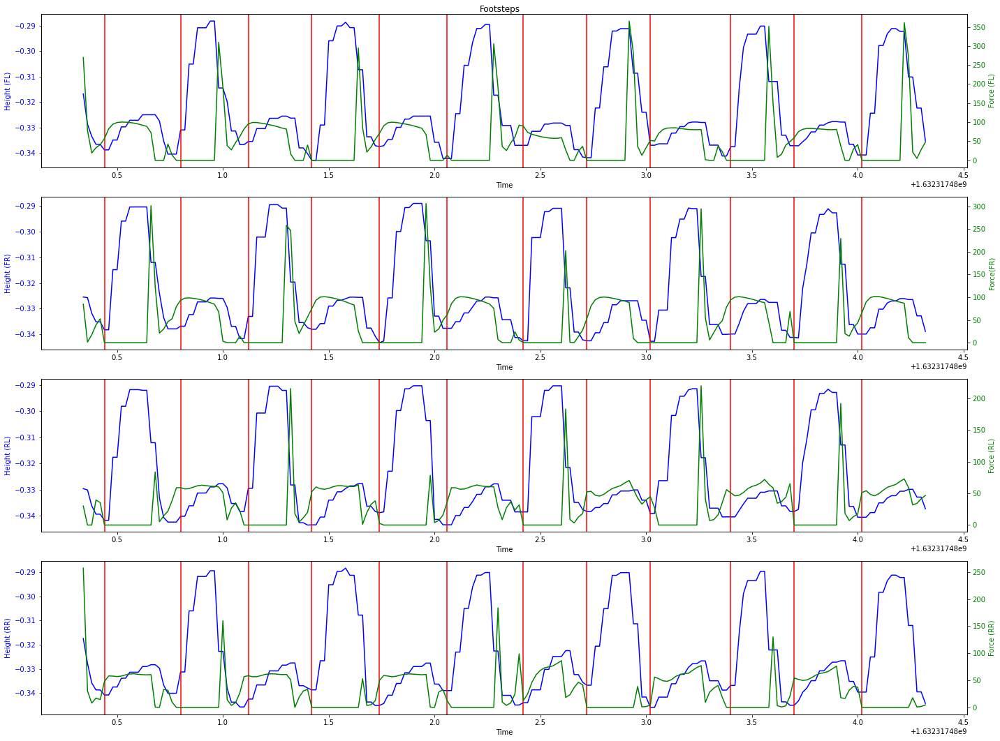

In [22]:
motion_fwd, footsteps_01_fwd = footstep_extraction_and_plotting(dataset=motion, velocities=[1, 0, 0], height_threshold=0.02, force_thresholds=[100,100,100,100], indexes=range(10000, 10200))

### Backward motion

In [23]:
#motion_bwd, footsteps_01_bwd = footstep_extraction_and_plotting(dataset=motion, velocities=[-velocity, 0, 0], height_threshold=0.02, force_thresholds=[50,50,50,50], indexes=range(0, 500))

### Side motion (right)

Foot swinging motions lenghts:  92884 92884 92884 92884
Max diff between fr and fl:  0.05604437
Max diff between rr and rl:  0.060697019
Min and max diff between front and rear feet 1.4991e-05 0.099774361 

Amount of footsteps found with height criteria:  33640 

Number of force footsteps:  92870 

Number of height-force footsteps:  33638 

Footsteps extracted:  33638
Footsteps after non-maximum-suppression:  5615


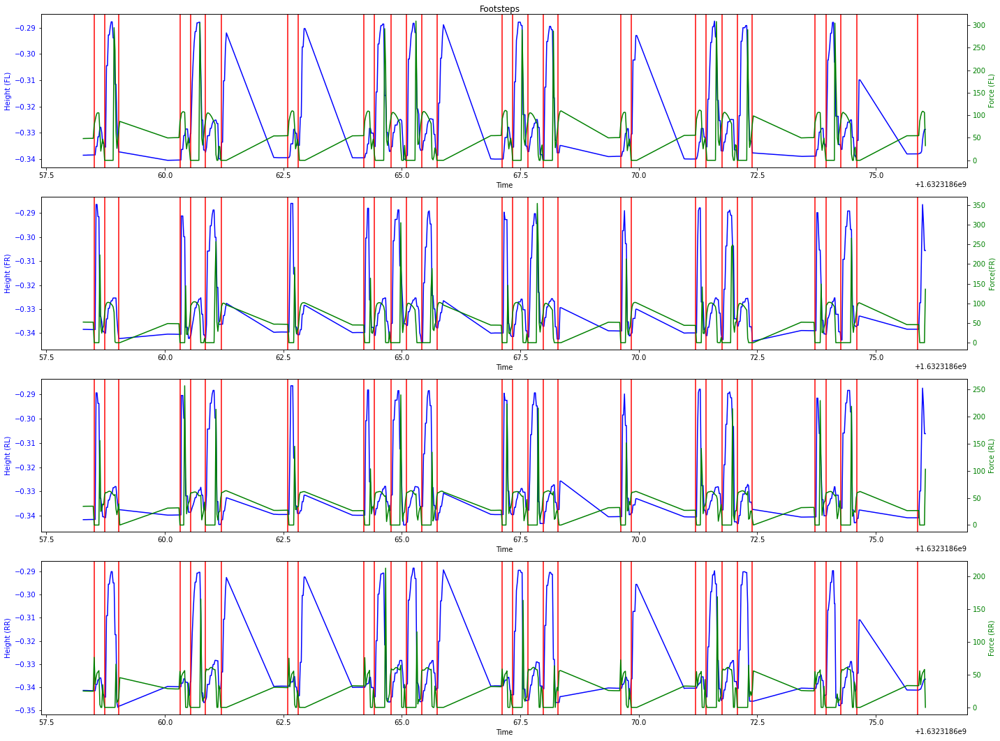

In [24]:
motion_side_right, footsteps_01_side_right = footstep_extraction_and_plotting(dataset=motion, velocities=[0, -1, 0],  height_threshold=0.02, force_thresholds=[100,100,100,100], indexes=range(0, 500))

### Side (left)

Foot swinging motions lenghts:  92756 92756 92756 92756
Max diff between fr and fl:  0.055202395
Max diff between rr and rl:  0.058857203
Min and max diff between front and rear feet 2.563e-06 0.100454837 

Amount of footsteps found with height criteria:  35769 

Number of force footsteps:  92750 

Number of height-force footsteps:  35768 

Footsteps extracted:  35768
Footsteps after non-maximum-suppression:  5599


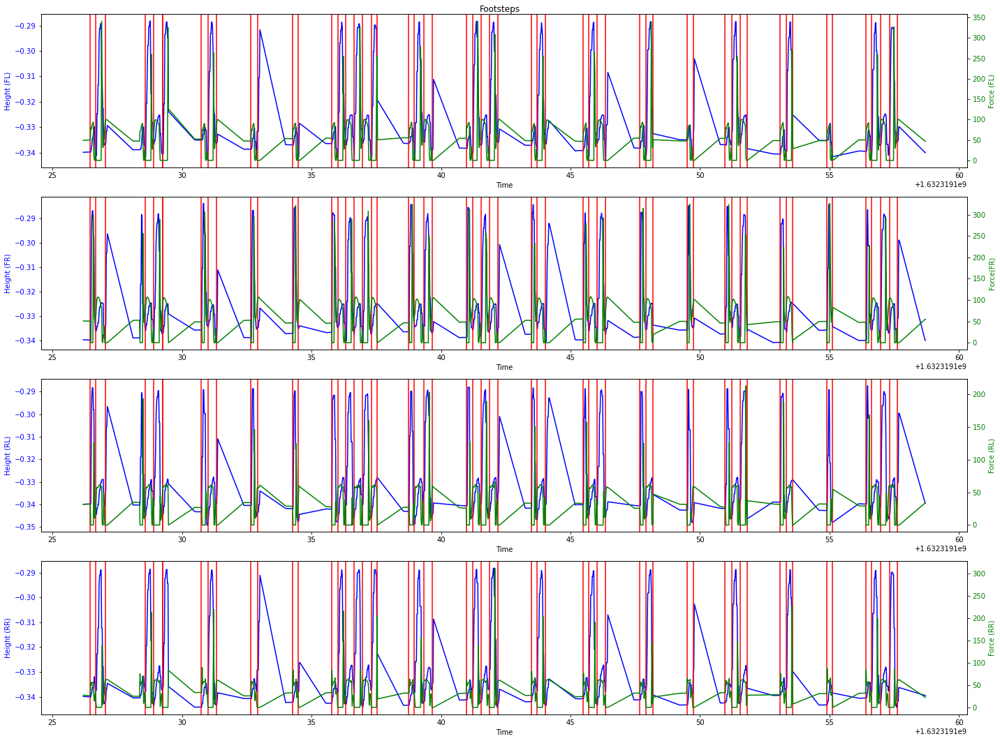

In [25]:
motion_side_left, footsteps_01_side_left = footstep_extraction_and_plotting(dataset=motion, velocities=[0, 1, 0],  height_threshold=0.02, force_thresholds=[100,100,100,100], indexes=range(0, 850))

### Rotation (clockwise)

Foot swinging motions lenghts:  92465 92465 92465 92465
Max diff between fr and fl:  0.049429059
Max diff between rr and rl:  0.051784456
Min and max diff between front and rear feet 5.9068e-05 0.100735635 

Amount of footsteps found with height criteria:  39490 

Number of force footsteps:  92463 

Number of height-force footsteps:  39490 

Footsteps extracted:  39490
Footsteps after non-maximum-suppression:  5719


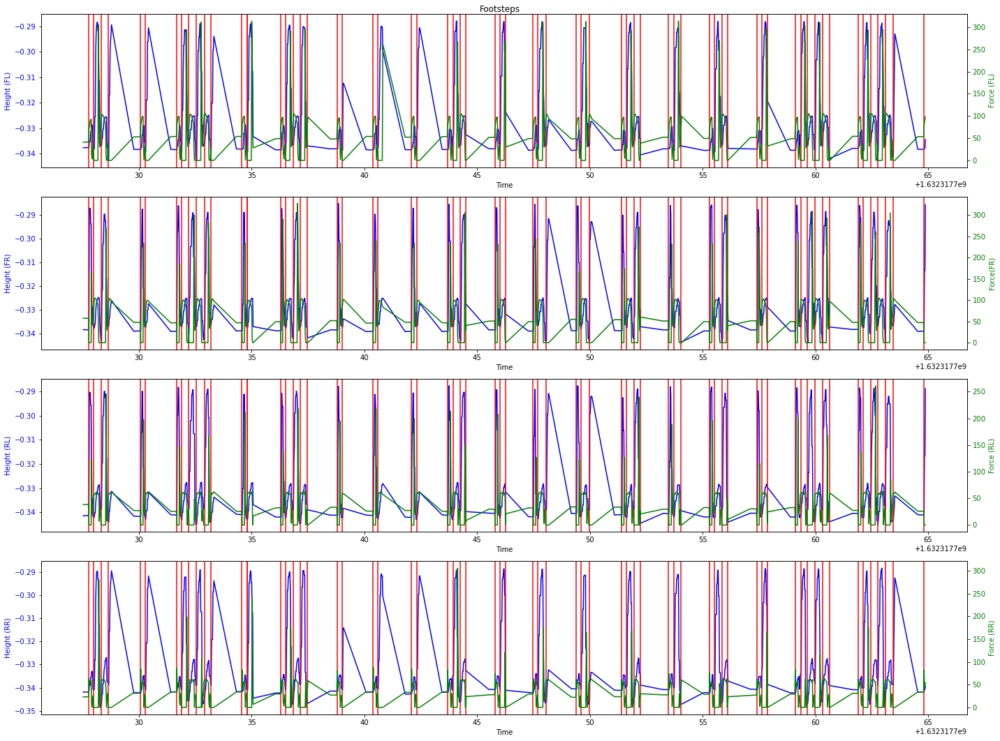

In [26]:
motion_clock, footsteps_01_clock = footstep_extraction_and_plotting(dataset=motion, velocities=[0, 0, -1],  height_threshold=0.02, force_thresholds=[100,100,100,100], indexes=range(0, 1000))

### Rotation (counter clockwise)

Foot swinging motions lenghts:  93031 93031 93031 93031
Max diff between fr and fl:  0.050030649
Max diff between rr and rl:  0.051425546
Min and max diff between front and rear feet 6.437e-06 0.100144774 

Amount of footsteps found with height criteria:  39858 

Number of force footsteps:  93009 

Number of height-force footsteps:  39855 

Footsteps extracted:  39855
Footsteps after non-maximum-suppression:  5763


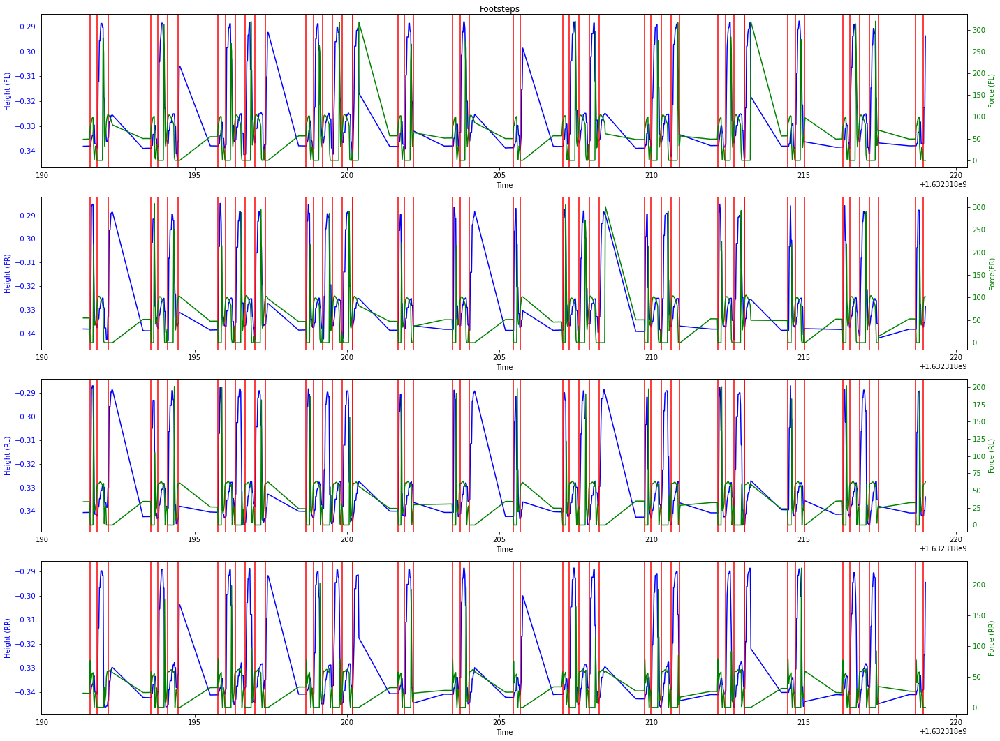

In [27]:
motion_count, footsteps_01_count = footstep_extraction_and_plotting(dataset=motion, velocities=[0, 0, 1],  height_threshold=0.02, force_thresholds=[100,100,100,100], indexes=range(0, 800))

### Step size

In [30]:
def get_step_size(dataset, footsteps, idx_coord=[7,10,13,16]):
    # Footsteps sizes
    step_size_fr = []
    step_size_fl = []
    step_size_rr = []
    step_size_rl = []
    footstep_period = []
    
    # Compute step sizes
    for idx, footstep in enumerate(footsteps):
        if idx > 0:
            time_diff = dataset[footsteps[idx], 0] - dataset[footsteps[idx-1], 0]
            #print("Time diff: ", time_diff)

            if time_diff < 1.0:
                footstep_period.append(time_diff)
                step_size_fl.append(dataset[footsteps[idx], idx_coord[0]] - dataset[footsteps[idx-1], idx_coord[0]])
                step_size_fr.append(dataset[footsteps[idx], idx_coord[1]] - dataset[footsteps[idx-1], idx_coord[1]])
                step_size_rl.append(dataset[footsteps[idx], idx_coord[2]] - dataset[footsteps[idx-1], idx_coord[2]])
                step_size_rr.append(dataset[footsteps[idx], idx_coord[3]] - dataset[footsteps[idx-1], idx_coord[3]])
    
    # Convert to numpy array
    step_size_fl_numpy = np.array(step_size_fl)
    step_size_fr_numpy = np.array(step_size_fr)
    step_size_rl_numpy = np.array(step_size_rl)
    step_size_rr_numpy = np.array(step_size_rr)
    footstep_period_numpy = np.array(footstep_period)
    
    # Only keep positive footsteps
    step_size_fl_numpy = step_size_fl_numpy[np.where(step_size_fl_numpy > 0)[0]]
    step_size_fr_numpy = step_size_fr_numpy[np.where(step_size_fr_numpy > 0)[0]]
    step_size_rl_numpy = step_size_rl_numpy[np.where(step_size_rl_numpy > 0)[0]]
    step_size_rr_numpy = step_size_rr_numpy[np.where(step_size_rr_numpy > 0)[0]]
                
    # Print average step-size
    print("Avg. step size time: ", np.mean(footstep_period_numpy))
    print("Min. step size time: ", np.min(footstep_period_numpy))
    print("Max. step size time: ", np.max(footstep_period_numpy))
    print("Std. step size time: ", np.std(footstep_period_numpy), "\n")
    #print(footstep_period_numpy)
    print("Avg. step size for FL foot: ", np.mean(step_size_fl_numpy))
    print("Avg. step size for FR foot: ", np.mean(step_size_fr_numpy))
    print("Avg. step size for RL foot: ", np.mean(step_size_rl_numpy))
    print("Avg. step size for RR foot: ", np.mean(step_size_rr_numpy), '\n')

    # Print std. dev. step-size
    print("Std. dev. step size for FL foot: ", np.std(step_size_fl_numpy))
    print("Std. dev. step size for FR foot: ", np.std(step_size_fr_numpy))
    print("Std. dev. step size for RL foot: ", np.std(step_size_rl_numpy))
    print("Std. dev. step size for RR foot: ", np.std(step_size_rr_numpy), '\n')
    
    return step_size_fr_numpy, step_size_fl_numpy, step_size_rr_numpy, step_size_rl_numpy

#### Forward motion

In [31]:
# Step size and velocity along x axis 
step_size_fr_x_fwd,_,_,_ = get_step_size(motion_fwd, footsteps_01_fwd)

Avg. step size time:  0.24385245901639344
Min. step size time:  0.0
Max. step size time:  0.4100000858306885
Std. step size time:  0.14271631328603604 

Avg. step size for FL foot:  0.03050399678085714
Avg. step size for FR foot:  0.027445337532663046
Avg. step size for RL foot:  0.02573790692765217
Avg. step size for RR foot:  0.02604895699156045 

Std. dev. step size for FL foot:  0.00252154691324068
Std. dev. step size for FR foot:  0.004536847734388766
Std. dev. step size for RL foot:  0.00583241122882953
Std. dev. step size for RR foot:  0.0035878597578039946 



In [45]:
# Step size of base displacement
print("Avg. step size base(x): ", np.mean(Y_motion_fwd_CoM[:, 0]))
print("Min. step size base(x): ", np.min(Y_motion_fwd_CoM[:, 0]))
print("Max. step size base(x): ", np.max(Y_motion_fwd_CoM[:, 0]))
print("Std. step size base(x): ", np.std(Y_motion_fwd_CoM[:, 0]), "\n")

Avg. step size base:  0.019780761806752655
Min. step size time:  0.0007377192459587035
Max. step size time:  0.03773605583208095
Std. step size time:  0.008248869889637795 



In [32]:
# Step size along y axis 
_,_,_,_ = get_step_size(motion_fwd, footsteps_01_fwd, idx_coord=[8, 11, 14, 17])

Avg. step size time:  0.24385245901639344
Min. step size time:  0.0
Max. step size time:  0.4100000858306885
Std. step size time:  0.14271631328603604 

Avg. step size for FL foot:  0.004381383185835166
Avg. step size for FR foot:  0.0025328492725164844
Avg. step size for RL foot:  0.002099659335719102
Avg. step size for RR foot:  0.0008240020083010742 

Std. dev. step size for FL foot:  0.0010946780117692008
Std. dev. step size for FR foot:  0.00104526719830566
Std. dev. step size for RL foot:  0.0009469637331667197
Std. dev. step size for RR foot:  0.000556528038106873 



### Side motion (right)

In [33]:
# Step size and velocity along x axis 
step_size_fr_x,_,_,_ = get_step_size(motion_side_right, footsteps_01_side_right)

Avg. step size time:  0.24668049713388024
Min. step size time:  0.0
Max. step size time:  0.3900001049041748
Std. step size time:  0.1411238856608624 

Avg. step size for FL foot:  0.007712062934141305
Avg. step size for FR foot:  0.002778341973208792
Avg. step size for RL foot:  0.007406467592362637
Avg. step size for RR foot:  0.0056507567782967056 

Std. dev. step size for FL foot:  0.0006829770347111907
Std. dev. step size for FR foot:  0.0005462542546683695
Std. dev. step size for RL foot:  0.0011523353369628565
Std. dev. step size for RR foot:  0.001329593740753779 



In [34]:
# Step size along y axis 
_,_,_,_ = get_step_size(motion_side_right, footsteps_01_side_right, idx_coord=[8, 11, 14, 17])

Avg. step size time:  0.24668049713388024
Min. step size time:  0.0
Max. step size time:  0.3900001049041748
Std. step size time:  0.1411238856608624 

Avg. step size for FL foot:  0.0404885941711413
Avg. step size for FR foot:  0.028750510988725275
Avg. step size for RL foot:  0.029656784383736267
Avg. step size for RR foot:  0.03464171258002173 

Std. dev. step size for FL foot:  0.0037878763691898297
Std. dev. step size for FR foot:  0.005578456280859493
Std. dev. step size for RL foot:  0.00390311799213234
Std. dev. step size for RR foot:  0.003822089350618859 



### Side motions (left)

In [35]:
# Step size and velocity along x axis 
step_size_fr_x,_,_,_ = get_step_size(motion_side_left, footsteps_01_side_left)

Avg. step size time:  0.2312840469152547
Min. step size time:  0.0
Max. step size time:  0.40000009536743164
Std. step size time:  0.14918554994909183 

Avg. step size for FL foot:  0.0034571863387173898
Avg. step size for FR foot:  0.005868318316692308
Avg. step size for RL foot:  0.006856652079021975
Avg. step size for RR foot:  0.00925374387401087 

Std. dev. step size for FL foot:  0.0005538508910135105
Std. dev. step size for FR foot:  0.0005385396197613701
Std. dev. step size for RL foot:  0.0013839381178822577
Std. dev. step size for RR foot:  0.0016592872696810932 



In [36]:
# Step size along y axis 
_,_,_,_ = get_step_size(motion_side_left, footsteps_01_side_left, idx_coord=[8, 11, 14, 17])

Avg. step size time:  0.2312840469152547
Min. step size time:  0.0
Max. step size time:  0.40000009536743164
Std. step size time:  0.14918554994909183 

Avg. step size for FL foot:  0.03134684813214286
Avg. step size for FR foot:  0.035701896428478264
Avg. step size for RL foot:  0.03212152777808695
Avg. step size for RR foot:  0.031435825995021975 

Std. dev. step size for FL foot:  0.0039047761517739506
Std. dev. step size for FR foot:  0.004251880411895746
Std. dev. step size for RL foot:  0.005258276710118834
Std. dev. step size for RR foot:  0.002500620154529186 



### Rotation (clockwise)

In [33]:
# Step size and velocity along x axis 
step_size_fr_x,_,_,_ = get_step_size(motion_clock, footsteps_01_clock)

Avg. step size time:  0.31166768423580293
Min. step size time:  0.0
Max. step size time:  0.38000011444091797
Std. step size time:  0.04581007725274728 

Avg. step size for FL foot:  0.001326670638847059
Avg. step size for FR foot:  0.00826363193562897
Avg. step size for RL foot:  0.0032130037572611386
Avg. step size for RR foot:  0.013646976754884427 

Std. dev. step size for FL foot:  0.0010474336551081133
Std. dev. step size for FR foot:  0.0019500821700968232
Std. dev. step size for RL foot:  0.0019164813294066361
Std. dev. step size for RR foot:  0.0043675217375368945 



In [34]:
# Step size along y axis 
_,_,_,_ = get_step_size(motion_clock, footsteps_01_clock, idx_coord=[8, 11, 14, 17])

Avg. step size time:  0.31166768423580293
Min. step size time:  0.0
Max. step size time:  0.38000011444091797
Std. step size time:  0.04581007725274728 

Avg. step size for FL foot:  0.011622868547838974
Avg. step size for FR foot:  0.004263587803113874
Avg. step size for RL foot:  0.012148520970161216
Avg. step size for RR foot:  0.013154059998663186 

Std. dev. step size for FL foot:  0.0037178763349317826
Std. dev. step size for FR foot:  0.0026357750902249043
Std. dev. step size for RL foot:  0.004886928721046719
Std. dev. step size for RR foot:  0.0030378387037937856 



### Rotation (counter clockwise)

In [35]:
# Step size and velocity along x axis 
step_size_fr_x,_,_,_ = get_step_size(motion_count, footsteps_01_count)

Avg. step size time:  0.31202039511968105
Min. step size time:  0.0
Max. step size time:  0.38000011444091797
Std. step size time:  0.042917021360556765 

Avg. step size for FL foot:  0.009925445227938182
Avg. step size for FR foot:  0.0012866891825332473
Avg. step size for RL foot:  0.013866590178621255
Avg. step size for RR foot:  0.0030667124261058976 

Std. dev. step size for FL foot:  0.002656505095743483
Std. dev. step size for FR foot:  0.0010691636777481214
Std. dev. step size for RL foot:  0.002204377381692301
Std. dev. step size for RR foot:  0.0020572372200189427 



In [36]:
# Step size along y axis 
_,_,_,_ = get_step_size(motion_count, footsteps_01_count, idx_coord=[8, 11, 14, 17])

Avg. step size time:  0.31202039511968105
Min. step size time:  0.0
Max. step size time:  0.38000011444091797
Std. step size time:  0.042917021360556765 

Avg. step size for FL foot:  0.003797730858521107
Avg. step size for FR foot:  0.009290906293233009
Avg. step size for RL foot:  0.010450101671086839
Avg. step size for RR foot:  0.012854065062579587 

Std. dev. step size for FL foot:  0.002248552230286851
Std. dev. step size for FR foot:  0.003370583428556699
Std. dev. step size for RL foot:  0.0030303505644818526
Std. dev. step size for RR foot:  0.004198818585748976 



### Footstep visualization

In [28]:
def euler_from_quaternion(x, y, z, w):
    """
    Convert a quaternion into euler angles (roll, pitch, yaw)
    roll is rotation around x in radians (counterclockwise)
    pitch is rotation around y in radians (counterclockwise)
    yaw is rotation around z in radians (counterclockwise)
    """
    t0 = +2.0 * (w * x + y * z)
    t1 = +1.0 - 2.0 * (x * x + y * y)
    roll_x = math.atan2(t0, t1)
     
    t2 = +2.0 * (w * y - z * x)
    t2 = +1.0 if t2 > +1.0 else t2
    t2 = -1.0 if t2 < -1.0 else t2
    pitch_y = math.asin(t2)
     
    t3 = +2.0 * (w * z + x * y)
    t4 = +1.0 - 2.0 * (y * y + z * z)
    yaw_z = math.atan2(t3, t4)
     
    return roll_x, pitch_y, yaw_z # in radians

In [29]:
def visualize_static_foosteps(dataset, footsteps):
    old_xs = None
    old_ys = None
    old_zs = None
    
    # Visualize footsteps
    for idx, footstep in enumerate(footsteps):
        fig = plt.figure()
        ax = fig.add_subplot(projection='3d')

        #ax.set_xlim([-0.5, 0.5])
        #ax.set_ylim([-0.3, 0.3])
        ax.set_zlim([-0.5, 0.5])

        dataset[footstep, 7:19] = np.round(dataset[footstep, 7:19], 3)
        
        time_diff = dataset[footsteps[idx], 0] - dataset[footsteps[idx-1], 0]
            
        # 3D positions        
        xs = np.array([dataset[footstep, 7], dataset[footstep, 10], dataset[footstep, 13], dataset[footstep, 16]])
        ys = np.array([dataset[footstep, 8], dataset[footstep, 11], dataset[footstep, 14], dataset[footstep, 17]])
        zz = np.array([dataset[footstep, 9], dataset[footstep, 12], dataset[footstep, 15], dataset[footstep, 18]])

        ax.scatter(xs, ys, zs, marker='o')

        ax.set_xlabel('X Label')
        ax.set_ylabel('Y Label')
        ax.set_zlabel('Z Label')

        plt.show()

        #print(xs, ys, zs, dataset[footstep, 2:5], dataset[footstep, 25:28])
        if idx > 0 and idx < len(footsteps):
            print(f'Diff: {time_diff}. Command: {dataset[footstep, 1:7]}. Coord: {[xs[0], ys[0], zs[0]]}. Step size: {[xs[0]-old_xs[0], ys[0]-old_ys[0], zs[0]-old_zs[0]]}.')
        else:
            print(f'Command: {dataset[footstep, 1:7]}. Coord: {[xs[0], ys[0], zs[0]]}.')
            
        old_xs = xs
        old_ys = ys
        old_zs = zs

In [30]:
def update_points(num, dataset, footsteps, x, y, z, points):    
    # Starting footstep index
    footstep = footsteps[num]
    
    # Round footsteps position
    dataset[footstep, 7:19] = np.round(dataset[footstep, 7:19], 3)

    # Initial footsteps 3D positions
    new_x = np.array([dataset[footstep, 7], dataset[footstep, 10], dataset[footstep, 13], dataset[footstep, 16]])
    new_y = np.array([dataset[footstep, 8], dataset[footstep, 11], dataset[footstep, 14], dataset[footstep, 17]])
    new_z = np.array([dataset[footstep, 9], dataset[footstep, 12], dataset[footstep, 15], dataset[footstep, 18]])

    # update properties
    points.set_data(new_x, new_y)
    points.set_3d_properties(new_z, 'z')

    # return modified artists
    return points

def visualize_animated_footsteps(dataset, footsteps, style: str):
    # Create figure
    fig = plt.figure()
    ax = p3.Axes3D(fig)

    # Setting the axes properties
    ax.set_xlim3d([-0.4, 0.4])
    ax.set_xlabel('X')

    ax.set_ylim3d([-0.2, 0.2])
    ax.set_ylabel('Y')

    ax.set_zlim3d([-0.5, 0.5])
    ax.set_zlabel('Z')

    # Starting footstep index
    footstep = footsteps[0]

    # Round footsteps position
    dataset[footstep, 7:19] = np.round(dataset[footstep, 7:19], 3)

    # Initial footsteps 3D positions
    x = np.array([dataset[footstep, 7], dataset[footstep, 10], dataset[footstep, 13], dataset[footstep, 16]])
    y = np.array([dataset[footstep, 8], dataset[footstep, 11], dataset[footstep, 14], dataset[footstep, 17]])
    z = np.array([dataset[footstep, 9], dataset[footstep, 12], dataset[footstep, 15], dataset[footstep, 18]])

    txt = fig.suptitle('')
    points, = ax.plot(x, y, z, style)
    
    # blit=True re-draws only the parts that have changed.
    anim = animation.FuncAnimation(fig, update_points, frames=len(footsteps), fargs=(dataset, footsteps, x, y, z, points))
    
    return anim   

In [34]:
def visualize_absolute_foostep_sizes(dataset, footsteps, threshold=0.02):
    prev_yaw = 0
    
    # Visualize footsteps
    for idx, footstep in enumerate(footsteps):
        dataset[footstep, 7:19] = np.round(dataset[footstep, 7:19], 3)
        
        if idx < (len(footsteps) - 1):
            print("Command: ", dataset[footstep, 1:3], dataset[footstep, 6])
            time_difference = abs(dataset[footsteps[idx], 0] - dataset[footsteps[idx+1], 0])
            
            if time_difference < 0.4 and time_difference > 0:
                fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))
                axes[0].set_xlabel('X Label')
                axes[0].set_ylabel('Y Label')
                axes[1].set_xlabel('X Label')
                axes[1].set_ylabel('Y Label')
    
                # Find corresponding index between two consecutive footsteps
                lower_bound_index = np.abs(dataset[:, 0] - (dataset[footsteps[idx], 0]))
                upper_bound_index = np.abs(dataset[:, 0] - (dataset[footsteps[idx], 0] + time_difference))
                matching_index_lower_bound = lower_bound_index.argmin()
                matching_index_upper_bound = upper_bound_index.argmin()

                # Retrieve what is the maximum height
                # reached in between the current and
                # next footstep
                height_peeks_in_between = [dataset[matching_index_lower_bound:matching_index_upper_bound, x] for x in [9, 12, 15, 18]]

                fl_moving = max(height_peeks_in_between[0]) > -0.31
                fr_moving = max(height_peeks_in_between[1]) > -0.31
                rl_moving = max(height_peeks_in_between[2]) > -0.31
                rr_moving = max(height_peeks_in_between[3]) > -0.31
                                
                if (not fr_moving != fl_moving):
                    print("Exception")
                    continue
                    
                # Get euler angles from odom to base rotation
                _, _, curr_yaw = euler_from_quaternion(dataset[footstep, 22], dataset[footstep, 23], dataset[footstep, 24], dataset[footstep, 25])
                _, _, next_yaw = euler_from_quaternion(dataset[footsteps[idx+1], 22], dataset[footsteps[idx+1], 23], dataset[footsteps[idx+1], 24], dataset[footsteps[idx+1], 25])

                # Compute rotation matrix
                c_curr, s_curr = np.cos(curr_yaw), np.sin(curr_yaw)
                c_next, s_next = np.cos(next_yaw), np.sin(next_yaw)
                R_curr = np.array(((c_curr, -s_curr), (s_curr, c_curr)))
                R_next = np.array(((c_next, -s_next), (s_next, c_next)))
                
                # Odom base vectors
                curr_base = np.array([[dataset[footstep, 19], dataset[footstep, 20]]])
                next_base = np.array([[dataset[footsteps[idx+1], 19], dataset[footsteps[idx+1], 20]]])
                
                # Local base vectors
                local_curr_base = R_curr.T @ curr_base.T
                local_next_base = R_curr.T @ next_base.T
                local_next_base_next = R_next.T @ next_base.T
                base_displacement = local_next_base - local_curr_base
                
                #print("Footstep timestamp: ", dataset[footstep, 0])
                print(f'\nFL moving: {fl_moving}. FR moving: {fr_moving}')
                print(f'RL moving: {rl_moving}. RR moving: {rr_moving}')
                
                #print(f'Curr base (not transformed): {dataset[footstep, 31:33]}. Next base (not transformed): {dataset[footsteps[idx+1], 31:33]}.')
                #print(f'Curr base transformed (x): {local_curr_base.tolist()}.\nNext base transformed (y): {local_next_base.tolist()}.\nNext base transformed2 (y): {local_next_base_next.tolist()}\n')
                print(prev_yaw, curr_yaw)
                print(f'Base displacement: {base_displacement.tolist()}. Rotation displacement: {(curr_yaw - prev_yaw) * 180 / np.pi}.\n')
                
                print("CoM displacement: ")
                print(f'FL (x): {dataset[footsteps[idx], 7]}, {dataset[footsteps[idx+1], 7]}, FL (y): {dataset[footsteps[idx], 8]}, {dataset[footsteps[idx+1], 8]}.')
                print(f'FL displacement: {(dataset[footsteps[idx+1], 7] - dataset[footsteps[idx], 7]).tolist()}, {(dataset[footsteps[idx+1], 8] - dataset[footsteps[idx], 8]).tolist()}.\n')
                
                print(f'FR (x): {dataset[footsteps[idx], 10]}, {dataset[footsteps[idx+1], 10]}, FR (y): {dataset[footsteps[idx], 11]}, {dataset[footsteps[idx+1], 11]}.')
                print(f'FR displacement: {(dataset[footsteps[idx+1], 10] - dataset[footsteps[idx], 10]).tolist()}, {(dataset[footsteps[idx+1], 11] - dataset[footsteps[idx], 11]).tolist()}.\n')
                
                print(f'RL (x): {dataset[footsteps[idx], 13]}, {dataset[footsteps[idx+1], 13]}, RL (y): {dataset[footsteps[idx], 14]}, {dataset[footsteps[idx+1], 14]}.')
                print(f'RL displacement: {(dataset[footsteps[idx+1], 13] - dataset[footsteps[idx], 13]).tolist()}, {(dataset[footsteps[idx+1], 14] - dataset[footsteps[idx], 14]).tolist()}.\n')
                
                print(f'RR (x): {dataset[footsteps[idx], 16]}, {dataset[footsteps[idx+1], 16]}, RR (y): {dataset[footsteps[idx], 17]}, {dataset[footsteps[idx+1], 17]}.')
                print(f'RR displacement: {(dataset[footsteps[idx+1], 16] - dataset[footsteps[idx], 16]).tolist()}, {(dataset[footsteps[idx+1], 17] - dataset[footsteps[idx], 17]).tolist()}.\n')
        
                # Feet displacements
                fl_x_displacement = dataset[footsteps[idx+1], 7] - dataset[footsteps[idx], 7]
                fl_y_displacement = dataset[footsteps[idx+1], 8] - dataset[footsteps[idx], 8]
                fr_x_displacement = dataset[footsteps[idx+1], 10] - dataset[footsteps[idx], 10]
                fr_y_displacement = dataset[footsteps[idx+1], 11] - dataset[footsteps[idx], 11]
                rl_x_displacement = dataset[footsteps[idx+1], 13] - dataset[footsteps[idx], 13]
                rl_y_displacement = dataset[footsteps[idx+1], 14] - dataset[footsteps[idx], 14]
                rr_x_displacement = dataset[footsteps[idx+1], 16] - dataset[footsteps[idx], 16]
                rr_y_displacement = dataset[footsteps[idx+1], 17] - dataset[footsteps[idx], 17]
                
                # Support foot base displacement
                support_base_displacement = [0, 0]
                if fr_moving:
                    support_base_displacement[0] = -fl_x_displacement
                    support_base_displacement[1] = -fl_y_displacement
                else:
                    support_base_displacement[0] = -fr_x_displacement
                    support_base_displacement[1] = -fr_y_displacement
                
                prev_yaw = curr_yaw
                    
                print(f'\nBase displacement (CoM): {support_base_displacement}.\n')
                    
                x_0 = np.array([dataset[footstep, 7], 
                                dataset[footstep, 10],
                                dataset[footstep, 13], 
                                dataset[footstep, 16]])
                y_0 = np.array([dataset[footstep, 8], 
                                dataset[footstep, 11],
                                dataset[footstep, 14], 
                                dataset[footstep, 17]])
                
                """
                x_1 = np.array([dataset[footsteps[idx+1], 7], 
                                dataset[footsteps[idx+1], 10],
                                dataset[footsteps[idx+1], 13], 
                                dataset[footsteps[idx+1], 16]])
                y_1 = np.array([dataset[footsteps[idx+1], 8], 
                                dataset[footsteps[idx+1], 11],
                                dataset[footsteps[idx+1], 14], 
                                dataset[footsteps[idx+1], 17]])
                """
                
                x_1 = np.array([dataset[footstep, 7] + fl_x_displacement, 
                                dataset[footstep, 10] + fr_x_displacement,
                                dataset[footstep, 13] + rl_x_displacement, 
                                dataset[footstep, 16] + rr_x_displacement])
                y_1 = np.array([dataset[footstep, 8] + fl_y_displacement, 
                                dataset[footstep, 11] + fr_y_displacement,
                                dataset[footstep, 14] + rl_y_displacement, 
                                dataset[footstep, 17] + rr_y_displacement])
                
                #axes[0].scatter(x_0, y_0, c= 'b',marker='o')
                axes[0].scatter(x_0, y_0, c= 'm',marker='o')
                axes[0].scatter(0, 0, c= 'g', marker='^')
                axes[0].scatter(base_displacement[0], base_displacement[1], c= 'y', marker='^')
                axes[0].scatter(support_base_displacement[0], support_base_displacement[1], c= 'r', marker='^')
                
                #axes[1].scatter(x_1, y_1, c= 'r', marker='o')
                axes[1].scatter(x_1, y_1, c= 'c', marker='o')
                
                plt.show()
                
#visualize_absolute_foostep_sizes(motion_clock, footsteps_01_clock, threshold=0.01)                  

### Forward motion

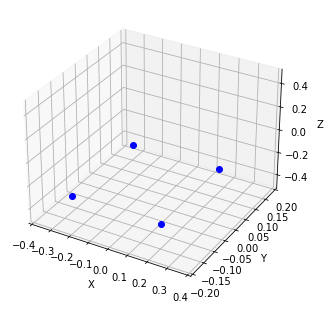

In [27]:
anim = visualize_animated_footsteps(motion_fwd, footsteps_01_fwd, "bo")
HTML(anim.to_html5_video())

### Backward motion

In [28]:
#anim = visualize_animated_footsteps(motion_bwd, footsteps_01_bwd, "bo")
#HTML(anim.to_html5_video())

### Side motion (right)

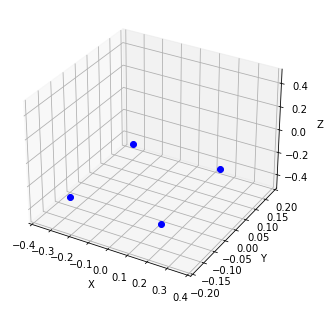

In [29]:
anim = visualize_animated_footsteps(motion_side_right, footsteps_01_side_right, "bo")
HTML(anim.to_html5_video())

### Side motion (left)

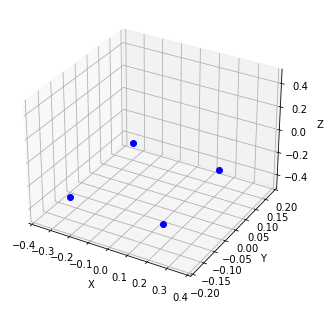

In [30]:
anim = visualize_animated_footsteps(motion_side_left, footsteps_01_side_left, "bo")
HTML(anim.to_html5_video())

### Rotation (clockwise)

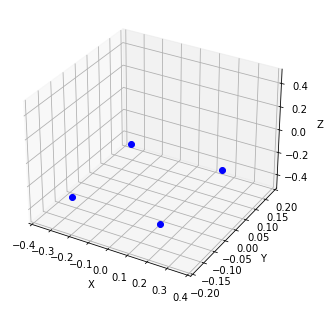

In [31]:
anim = visualize_animated_footsteps(motion_clock, footsteps_01_clock, "bo")
HTML(anim.to_html5_video())

### Rotation (counter clockwise)

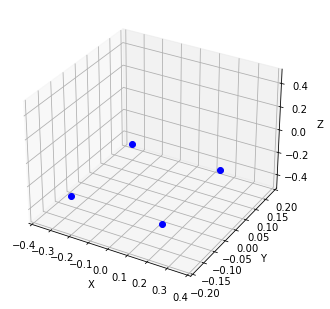

In [32]:
anim = visualize_animated_footsteps(motion_count, footsteps_01_count, "bo")
HTML(anim.to_html5_video())

# Multivariate Linear Regression (FR foot prediction)

The input will use initially only:

- **HighCmd: fwd, side, rot speeds**
- **HighState: fwd, side, rot speeds, footPosition2Body (FR)**

and as output we seek to predict the following:

- **footPosition2Body (FR)**

In [ ]:
import sklearn
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split

In [ ]:
def plot_target_and_predictions(title: str, predictions, target):
    fig, ax1 = plt.subplots(1,1, figsize=(15,10))
    fig.suptitle(title)
    
    # FR plot (height)
    ax1.plot(range(predictions.shape[0]), predictions, 'b-')
    ax1.set_ylabel('Predictions')
    ax1.set_xlabel('Time')
         
    # FR plot (force)
    ax2 = ax1.twinx()
    ax2.plot(range(predictions.shape[0]), target, 'g-')
    ax2.set_ylabel('Target', color='g')

    for tl in ax2.get_yticklabels():
        tl.set_color('g')
    
    fig.tight_layout()
    plt.show()

In [21]:
def create_step_size_dataset(dataset, footsteps, motion=None, debug=False):
    # General
    inputs = []
    labels = []
    com_velocity_x = 0
    com_velocity_y = 0
    last_footsteps = [0, 0, 0, 0, 0, 0, 0, 0]
    
    # Compute step sizes
    for idx, footstep in enumerate(footsteps):
        if idx < (len(footsteps) - 1):
            # Compute time difference between
            # current and next footsteps
            time_difference = abs(dataset[footsteps[idx], 0] - dataset[footsteps[idx+1], 0])
            
            if time_difference < 0.4 and time_difference > 0:
                #inputs.append(dataset[footsteps[idx-1], 1:7].tolist() + dataset[footsteps[idx-1], 34:40].tolist() + dataset[footsteps[idx-1], 7:19].tolist())
                #labels.append(dataset[footsteps[idx], 7:19])
                
                # Find corresponding index between two consecutive footsteps
                lower_bound_index = np.abs(dataset[:, 0] - (dataset[footsteps[idx], 0]))
                upper_bound_index = np.abs(dataset[:, 0] - (dataset[footsteps[idx], 0] + time_difference))
                matching_index_lower_bound = lower_bound_index.argmin()
                matching_index_upper_bound = upper_bound_index.argmin()

                # Retrieve what is the maximum height
                # reached in between the current and
                # next footstep
                height_peeks_in_between = [dataset[matching_index_lower_bound:matching_index_upper_bound, x] for x in [9, 12, 15, 18]]

                fl_moving = max(height_peeks_in_between[0]) > -0.31
                fr_moving = max(height_peeks_in_between[1]) > -0.31
                rl_moving = max(height_peeks_in_between[2]) > -0.31
                rr_moving = max(height_peeks_in_between[3]) > -0.31
                
                if debug:
                    print(idx, height_peeks_in_between)
                    print("Time difference: ", time_difference)
                    print("Footstep timestamp: ", dataset[footstep, 0])
                    print(f'FL moving: {fl_moving}. FR moving: {fr_moving}')
                    print(f'RL moving: {rl_moving}. RR moving: {rr_moving}')

                if (not fr_moving != fl_moving):
                    #print("Exception")
                    #print(idx, height_peeks_in_between)
                    #print("Time difference: ", time_difference)
                    #print("Footstep timestamp: ", dataset[footstep, 0])
                    #print(f'FL moving: {fl_moving}. FR moving: {fr_moving}')
                    #print(f'RL moving: {rl_moving}. RR moving: {rr_moving}')
                    continue
                
                assert fr_moving == rl_moving
                assert rr_moving == fl_moving
                assert fr_moving != fl_moving
                
                # Compute FR movement
                fl_movement_x = dataset[footsteps[idx+1], 7] - dataset[footsteps[idx], 7]
                fl_movement_y = dataset[footsteps[idx+1], 8] - dataset[footsteps[idx], 8]

                # Compute FL movement
                fr_movement_x = dataset[footsteps[idx+1], 10] - dataset[footsteps[idx], 10]
                fr_movement_y = dataset[footsteps[idx+1], 11] - dataset[footsteps[idx], 11]

                # Compute RR movement
                rl_movement_x = dataset[footsteps[idx+1], 13] - dataset[footsteps[idx], 13]
                rl_movement_y = dataset[footsteps[idx+1], 14] - dataset[footsteps[idx], 14]

                # Compute RL movement
                rr_movement_x = dataset[footsteps[idx+1], 16] - dataset[footsteps[idx], 16]
                rr_movement_y = dataset[footsteps[idx+1], 17] - dataset[footsteps[idx], 17]
                
                # Movement direction for FR/RL swing
                sign_fr_swing_x = +1 if dataset[footsteps[idx+1], 10] > dataset[footsteps[idx+1], 7] else -1
                sign_fr_swing_y = +1 if dataset[footsteps[idx+1], 11] > dataset[footsteps[idx+1], 17] else -1
                sign_rl_swing_x = +1 if dataset[footsteps[idx+1], 13] > dataset[footsteps[idx+1], 16] else -1
                sign_rl_swing_y = +1 if dataset[footsteps[idx+1], 14] > dataset[footsteps[idx+1], 8] else -1
                
                # Movement direction for FL/RR swing
                sign_fl_swing_x = +1 if dataset[footsteps[idx+1], 7] > dataset[footsteps[idx+1], 10] else -1
                sign_fl_swing_y = +1 if dataset[footsteps[idx+1], 17] > dataset[footsteps[idx+1], 11] else -1
                sign_rr_swing_x = +1 if dataset[footsteps[idx+1], 16] > dataset[footsteps[idx+1], 13] else -1
                sign_rr_swing_y = +1 if dataset[footsteps[idx+1], 8] > dataset[footsteps[idx+1], 14] else -1
                
                com_movement_x = None
                com_movement_y = None
                
                if motion == "forward":
                    if fr_moving:
                        com_movement_x = abs(dataset[footsteps[idx+1], 7] - dataset[footstep, 7])
                        com_movement_y = dataset[footsteps[idx+1], 8] - dataset[footstep, 8]
                    else:
                        com_movement_x = abs(dataset[footsteps[idx+1], 10] - dataset[footstep, 10])
                        com_movement_y = dataset[footsteps[idx+1], 11] - dataset[footstep, 11]
                
                if motion == "right":
                    if fr_moving:
                        com_movement_x = dataset[footsteps[idx+1], 7] - dataset[footstep, 7]
                        com_movement_y = -abs(dataset[footsteps[idx+1], 8] - dataset[footstep, 8])
                    else:
                        com_movement_x = dataset[footsteps[idx+1], 10] - dataset[footstep, 10]
                        com_movement_y = -abs(dataset[footsteps[idx+1], 11] - dataset[footstep, 11])
                
                if motion == "left":
                    if fr_moving:
                        com_movement_x = dataset[footsteps[idx+1], 7] - dataset[footstep, 7]
                        com_movement_y = abs(dataset[footsteps[idx+1], 8] - dataset[footstep, 8])
                    else:
                        com_movement_x = dataset[footsteps[idx+1], 10] - dataset[footstep, 10]
                        com_movement_y = abs(dataset[footsteps[idx+1], 11] - dataset[footstep, 11])
                
                if motion == "clock":
                    sign_fr_swing_y = -1
                    sign_rl_swing_y = 1
                    sign_fl_swing_y = -1
                    sign_rr_swing_y = 1
                    
                    if fr_moving:
                        com_movement_x = dataset[footsteps[idx+1], 7] - dataset[footstep, 7]
                        com_movement_y = -abs(dataset[footsteps[idx+1], 8] - dataset[footstep, 8]) + abs(dataset[footsteps[idx+1], 17] - dataset[footstep, 17])
                    else:
                        com_movement_x = dataset[footsteps[idx+1], 10] - dataset[footstep, 10]
                        com_movement_y = -abs(dataset[footsteps[idx+1], 11] - dataset[footstep, 11]) + abs(dataset[footsteps[idx+1], 14] - dataset[footstep, 14])
                
                if motion == "count":
                    sign_fr_swing_y = 1
                    sign_rl_swing_y = -1
                    sign_fl_swing_y = 1
                    sign_rr_swing_y = -1
                    
                    if fr_moving:
                        com_movement_x = dataset[footsteps[idx+1], 7] - dataset[footstep, 7]
                        com_movement_y = abs(dataset[footsteps[idx+1], 8] - dataset[footstep, 8]) - abs(dataset[footsteps[idx+1], 17] - dataset[footstep, 17])
                    else:
                        com_movement_x = dataset[footsteps[idx+1], 10] - dataset[footstep, 10]
                        com_movement_y = -abs(dataset[footsteps[idx+1], 11] - dataset[footstep, 11]) - abs(dataset[footsteps[idx+1], 14] - dataset[footstep, 14])
                                
                if debug:
                    print(f'Coord FL: {[dataset[footstep, 7], dataset[footstep, 8], dataset[footstep, 9]]}.')
                    print(f'Coord FR: {[dataset[footstep, 10], dataset[footstep, 11], dataset[footstep, 12]]}.')
                    print(f'Coord RL: {[dataset[footstep, 13], dataset[footstep, 14], dataset[footstep, 15]]}.')
                    print(f'Coord RR: {[dataset[footstep, 16], dataset[footstep, 17], dataset[footstep, 18]]}.')

                    print(f'\nCoord FL: {[dataset[footsteps[idx+1], 7], dataset[footsteps[idx+1], 8], dataset[footsteps[idx+1], 9]]}.')
                    print(f'Coord FR: {[dataset[footsteps[idx+1], 10], dataset[footsteps[idx+1], 11], dataset[footsteps[idx+1], 12]]}.')
                    print(f'Coord RL: {[dataset[footsteps[idx+1], 13], dataset[footsteps[idx+1], 14], dataset[footsteps[idx+1], 15]]}.')
                    print(f'Coord RR: {[dataset[footsteps[idx+1], 16], dataset[footsteps[idx+1], 17], dataset[footsteps[idx+1], 18]]}.')
                    
                # Timstamp
                DT = dataset[footsteps[idx+1], 0]-dataset[footsteps[idx], 0]
                
                # Inputs
                inputs.append(dataset[footsteps[idx], 1:7].tolist() + 
                              dataset[footsteps[idx], 34:40].tolist() + 
                              dataset[footsteps[idx], 7:19].tolist() + 
                              [fr_moving, fl_moving] + 
                              last_footsteps +
                              [com_velocity_x, com_velocity_y] +
                              [DT] + 
                              [dataset[footsteps[idx], 0]])
                                
                # Compute new velocity
                com_velocity_x = com_movement_x/DT
                com_velocity_y = com_movement_y/DT
    
                if fr_moving:
                    if debug:
                        print(fl_movement_x, fl_movement_y, fr_movement_x, fr_movement_y, rr_movement_x, rr_movement_y, rl_movement_x, rl_movement_y)
                        print(f'\nFL step_size x: {0}. FL step_size y: {0}.')
                        print(f'FR step_size x: {(abs(fr_movement_x) + abs(fl_movement_x)) * sign_fr_swing_x}. FR step_size y: {(abs(fr_movement_y) + abs(fl_movement_y)) * sign_fr_swing_y}.')
                        print(f'RL step_size x: {(abs(rr_movement_x) + abs(rl_movement_x)) * sign_rl_swing_x}. RL step_size y: {(abs(rr_movement_y) + abs(rl_movement_y)) * sign_rl_swing_y}.')
                        print(f'RR step_size x: {0}. RR step_size y: {0}.')
                        print(sign_fr_swing_x, sign_fr_swing_y, sign_rl_swing_x, sign_rl_swing_y)
                    labels.append([0, 
                                   0,
                                   (abs(fr_movement_x) + abs(fl_movement_x)) * sign_fr_swing_x, 
                                   (abs(fr_movement_y) + abs(fl_movement_y)) * sign_fr_swing_y,
                                   (abs(rr_movement_x) + abs(rl_movement_x)) * sign_rl_swing_x,
                                   (abs(rr_movement_y) + abs(rl_movement_y)) * sign_rl_swing_y,
                                   0,
                                   0])
                    #assert sign_fr_swing_y > 0
                    #assert sign_rl_swing_y < 0
                elif fl_moving:
                    if debug:
                        print(fl_movement_x, fl_movement_y, fr_movement_x, fr_movement_y, rr_movement_x, rr_movement_y, rl_movement_x, rl_movement_y)
                        print(f'\nFL step_size x: {(abs(fr_movement_x) + abs(fl_movement_x)) * sign_fl_swing_x}. FL step_size y: {(abs(fr_movement_y) + abs(fl_movement_y)) * sign_fl_swing_y}.')
                        print(f'FR step_size x: {0}. FR step_size y: {0}.')
                        print(f'RL step_size x: {0}. RL step_size y: {0}.')
                        print(f'RR step_size x: {(abs(rr_movement_x) + abs(rl_movement_x)) * sign_rr_swing_x}. RR step_size y: {(abs(rr_movement_y) + abs(rl_movement_y)) * sign_rr_swing_y}.')
                        print(sign_fl_swing_x, sign_fl_swing_y, sign_rr_swing_x, sign_rr_swing_y)
                    labels.append([(abs(fr_movement_x) + abs(fl_movement_x)) * sign_fl_swing_x, 
                                       (abs(fr_movement_y) + abs(fl_movement_y)) * sign_fl_swing_y,
                                       0, 
                                       0,
                                       0,
                                       0,
                                       (abs(rr_movement_x) + abs(rl_movement_x)) * sign_rr_swing_x,
                                       (abs(rr_movement_y) + abs(rl_movement_y)) * sign_rr_swing_y])
                    #assert sign_fl_swing_y > 0
                    #assert sign_rr_swing_y < 0
                if debug:
                    print("\n")

                last_footsteps = labels[-1]
            else:
                com_velocity_x = 0
                com_velocity_y = 0
                    
    # Convert to numpy array
    inputs_numpy = np.array(inputs)
    labels_numpy = np.array(labels)
    
    return inputs_numpy, labels_numpy

X_motion_fwd_step, Y_motion_fwd_step = create_step_size_dataset(motion_fwd, footsteps_01_fwd, motion="forward")
X_motion_clock_step, Y_motion_clock_step = create_step_size_dataset(motion_clock, footsteps_01_clock, motion="clock")
X_motion_count_step, Y_motion_count_step = create_step_size_dataset(motion_count, footsteps_01_count, motion="count")
X_motion_side_left_step, Y_motion_side_left_step = create_step_size_dataset(motion_side_left, footsteps_01_side_left, motion="left")
X_motion_side_right_step, Y_motion_side_right_step = create_step_size_dataset(motion_side_right, footsteps_01_side_right, motion="right")

# Stack datasets
X_motion_step = np.concatenate((X_motion_fwd_step, X_motion_side_right_step, X_motion_side_left_step, X_motion_clock_step, X_motion_count_step))
Y_motion_step = np.concatenate((Y_motion_fwd_step, Y_motion_side_right_step, Y_motion_side_left_step, Y_motion_clock_step, Y_motion_count_step))
print(X_motion_step.shape)
print(Y_motion_step.shape)

(148884, 38)
(148884, 8)


In [22]:
%store X_motion_step
%store Y_motion_step

Stored 'X_motion_step' (ndarray)
Stored 'Y_motion_step' (ndarray)


In [23]:
def create_3D_pose_dataset(dataset, footsteps, debug=False):
    # Footsteps sizes
    inputs = []
    labels = []
    
    for idx, footstep in enumerate(footsteps):
        if idx < (len(footsteps) - 1):
            # Compute time difference between
            # current and next footsteps
            time_difference = abs(dataset[footsteps[idx], 0] - dataset[footsteps[idx+1], 0])
            
            if time_difference < 0.4 and time_difference > 0:
                # Find corresponding index between two consecutive footsteps
                lower_bound_index = np.abs(dataset[:, 0] - (dataset[footsteps[idx], 0]))
                upper_bound_index = np.abs(dataset[:, 0] - (dataset[footsteps[idx], 0] + time_difference))
                matching_index_lower_bound = lower_bound_index.argmin()
                matching_index_upper_bound = upper_bound_index.argmin()

                # Retrieve what is the maximum height
                # reached in between the current and
                # next footstep
                height_peeks_in_between = [dataset[matching_index_lower_bound:matching_index_upper_bound, x] for x in [9, 12, 15, 18]]

                fl_moving = max(height_peeks_in_between[0]) > -0.31
                fr_moving = max(height_peeks_in_between[1]) > -0.31
                rl_moving = max(height_peeks_in_between[2]) > -0.31
                rr_moving = max(height_peeks_in_between[3]) > -0.31
                
                if debug:
                    print(idx, height_peeks_in_between)
                    print("Time difference: ", time_difference)
                    print("Footstep timestamp: ", dataset[footstep, 0])
                    print(f'FL moving: {fl_moving}. FR moving: {fr_moving}')
                    print(f'RL moving: {rl_moving}. RR moving: {rr_moving}')

                if (not fr_moving != fl_moving):
                    #print("Exception")
                    #print(idx, height_peeks_in_between)
                    #print("Time difference: ", time_difference)
                    #print("Footstep timestamp: ", dataset[footstep, 0])
                    #print(f'FL moving: {fl_moving}. FR moving: {fr_moving}')
                    #print(f'RL moving: {rl_moving}. RR moving: {rr_moving}')
                    continue
                
                assert fr_moving == rl_moving
                assert rr_moving == fl_moving
                assert fr_moving != fl_moving
            
                inputs.append(dataset[footsteps[idx], 1:7].tolist() + dataset[footsteps[idx], 34:40].tolist() + dataset[footsteps[idx], 7:19].tolist() + [fr_moving, fl_moving] + [dataset[footsteps[idx], 0]])
                labels.append(dataset[footsteps[idx+1], 7:19])
                    
    # Convert to numpy array
    inputs_numpy = np.array(inputs)
    labels_numpy = np.array(labels)
    
    return inputs_numpy, labels_numpy

X_motion_fwd_3D, Y_motion_fwd_3D = create_3D_pose_dataset(motion_fwd, footsteps_01_fwd)
#X_motion_bwd_3D, Y_motion_bwd_3D = create_3D_pose_dataset(motion_bwd, footsteps_01_bwd)
X_motion_clock_3D, Y_motion_clock_3D = create_3D_pose_dataset(motion_clock, footsteps_01_clock)
X_motion_count_3D, Y_motion_count_3D = create_3D_pose_dataset(motion_count, footsteps_01_count)
X_motion_side_left_3D, Y_motion_side_left_3D = create_3D_pose_dataset(motion_side_left, footsteps_01_side_left)
X_motion_side_right_3D, Y_motion_side_right_3D = create_3D_pose_dataset(motion_side_right, footsteps_01_side_right)

# Stack datasets
#X_motion_3D = np.concatenate((X_motion_fwd_3D, X_motion_bwd_3D, X_motion_side_right_3D, X_motion_side_left_3D, X_motion_clock_3D, X_motion_count_3D))
#Y_motion_3D = np.concatenate((Y_motion_fwd_3D, Y_motion_bwd_3D, Y_motion_side_right_3D, Y_motion_side_left_3D, Y_motion_clock_3D, Y_motion_count_3D))
X_motion_3D = np.concatenate((X_motion_fwd_3D, X_motion_side_right_3D, X_motion_side_left_3D, X_motion_clock_3D, X_motion_count_3D))
Y_motion_3D = np.concatenate((Y_motion_fwd_3D, Y_motion_side_right_3D, Y_motion_side_left_3D, Y_motion_clock_3D, Y_motion_count_3D))
print(X_motion_3D.shape)
print(Y_motion_3D.shape)

(148884, 27)
(148884, 12)


In [ ]:
%store X_motion_3D
%store Y_motion_3D

In [79]:
def create_relative_step_size_dataset(dataset, footsteps, debug=False):
    # Footsteps sizes
    inputs = []
    labels = []
    
    for idx, footstep in enumerate(footsteps):
        if idx < (len(footsteps) - 1):
            # Compute time difference between
            # current and next footsteps
            time_difference = abs(dataset[footsteps[idx], 0] - dataset[footsteps[idx+1], 0])
            
            if time_difference < 0.4 and time_difference > 0:
                # Find corresponding index between two consecutive footsteps
                lower_bound_index = np.abs(dataset[:, 0] - (dataset[footsteps[idx], 0]))
                upper_bound_index = np.abs(dataset[:, 0] - (dataset[footsteps[idx], 0] + time_difference))
                matching_index_lower_bound = lower_bound_index.argmin()
                matching_index_upper_bound = upper_bound_index.argmin()

                # Retrieve what is the maximum height
                # reached in between the current and
                # next footstep
                height_peeks_in_between = [dataset[matching_index_lower_bound:matching_index_upper_bound, x] for x in [9, 12, 15, 18]]

                fl_moving = max(height_peeks_in_between[0]) > -0.31
                fr_moving = max(height_peeks_in_between[1]) > -0.31
                rl_moving = max(height_peeks_in_between[2]) > -0.31
                rr_moving = max(height_peeks_in_between[3]) > -0.31
                
                if debug:
                    print(idx, height_peeks_in_between)
                    print("Time difference: ", time_difference)
                    print("Footstep timestamp: ", dataset[footstep, 0])
                    print(f'FL moving: {fl_moving}. FR moving: {fr_moving}')
                    print(f'RL moving: {rl_moving}. RR moving: {rr_moving}')

                if (not fr_moving != fl_moving):
                    #print("Exception")
                    #print(idx, height_peeks_in_between)
                    #print("Time difference: ", time_difference)
                    #print("Footstep timestamp: ", dataset[footstep, 0])
                    #print(f'FL moving: {fl_moving}. FR moving: {fr_moving}')
                    #print(f'RL moving: {rl_moving}. RR moving: {rr_moving}')
                    continue
                
                # Feet displacements
                fl_x_displacement = dataset[footsteps[idx+1], 7] - dataset[footsteps[idx], 7]
                fl_y_displacement = dataset[footsteps[idx+1], 8] - dataset[footsteps[idx], 8]
                fr_x_displacement = dataset[footsteps[idx+1], 10] - dataset[footsteps[idx], 10]
                fr_y_displacement = dataset[footsteps[idx+1], 11] - dataset[footsteps[idx], 11]
                rl_x_displacement = dataset[footsteps[idx+1], 13] - dataset[footsteps[idx], 13]
                rl_y_displacement = dataset[footsteps[idx+1], 14] - dataset[footsteps[idx], 14]
                rr_x_displacement = dataset[footsteps[idx+1], 16] - dataset[footsteps[idx], 16]
                rr_y_displacement = dataset[footsteps[idx+1], 17] - dataset[footsteps[idx], 17]

            
                inputs.append(dataset[footsteps[idx], 1:7].tolist() + dataset[footsteps[idx], 34:40].tolist() + dataset[footsteps[idx], 7:19].tolist() + [fr_moving, fl_moving] + [dataset[footsteps[idx], 0]])
                labels.append([fl_x_displacement, fl_y_displacement,
                               fr_x_displacement, fr_y_displacement,
                               rl_x_displacement, rl_y_displacement,
                               rr_x_displacement, rr_y_displacement])
                
    # Convert to numpy array
    inputs_numpy = np.array(inputs)
    labels_numpy = np.array(labels)
    
    return inputs_numpy, labels_numpy

X_motion_fwd_relative, Y_motion_fwd_relative = create_relative_step_size_dataset(motion_fwd, footsteps_01_fwd)
X_motion_clock_relative, Y_motion_clock_relative = create_relative_step_size_dataset(motion_clock, footsteps_01_clock)
X_motion_count_relative, Y_motion_count_relative = create_relative_step_size_dataset(motion_count, footsteps_01_count)
X_motion_side_left_relative, Y_motion_side_left_relative = create_relative_step_size_dataset(motion_side_left, footsteps_01_side_left)
X_motion_side_right_relative, Y_motion_side_right_relative = create_relative_step_size_dataset(motion_side_right, footsteps_01_side_right)

# Stack datasets
X_motion_relative = np.concatenate((X_motion_fwd_relative, X_motion_side_right_relative, X_motion_side_left_relative, X_motion_clock_relative, X_motion_count_relative))
Y_motion_relative = np.concatenate((Y_motion_fwd_relative, Y_motion_side_right_relative, Y_motion_side_left_relative, Y_motion_clock_relative, Y_motion_count_relative))
print(X_motion_relative.shape)
print(Y_motion_relative.shape)

(27032, 27)
(27032, 8)


In [80]:
%store X_motion_relative
%store Y_motion_relative

Stored 'X_motion_relative' (ndarray)
Stored 'Y_motion_relative' (ndarray)


In [40]:
def getCoMDataset(dataset, footsteps, motion=None, debug=False):
    # Footsteps sizes
    inputs = []
    labels = []
    prev_com_displacement = [0, 0]
    
    for idx, footstep in enumerate(footsteps):
        if idx < (len(footsteps) - 1):
            # Compute time difference between
            # current and next footsteps
            time_difference = abs(dataset[footsteps[idx], 0] - dataset[footsteps[idx+1], 0])
            
            if time_difference < 0.4 and time_difference > 0:
                # Find corresponding index between two consecutive footsteps
                lower_bound_index = np.abs(dataset[:, 0] - (dataset[footsteps[idx], 0]))
                upper_bound_index = np.abs(dataset[:, 0] - (dataset[footsteps[idx], 0] + time_difference))
                matching_index_lower_bound = lower_bound_index.argmin()
                matching_index_upper_bound = upper_bound_index.argmin()

                # Retrieve what is the maximum height
                # reached in between the current and
                # next footstep
                height_peeks_in_between = [dataset[matching_index_lower_bound:matching_index_upper_bound, x] for x in [9, 12, 15, 18]]

                fl_moving = max(height_peeks_in_between[0]) > -0.31
                fr_moving = max(height_peeks_in_between[1]) > -0.31
                rl_moving = max(height_peeks_in_between[2]) > -0.31
                rr_moving = max(height_peeks_in_between[3]) > -0.31
                
                if debug:
                    print(idx, height_peeks_in_between)
                    print("Time difference: ", time_difference)
                    print("Footstep timestamp: ", dataset[footstep, 0])
                    print(f'FL moving: {fl_moving}. FR moving: {fr_moving}')
                    print(f'RL moving: {rl_moving}. RR moving: {rr_moving}')

                if (not fr_moving != fl_moving):
                    #print("Exception")
                    continue
                    
                # Feet displacements
                fl_x_displacement = dataset[footsteps[idx+1], 7] - dataset[footsteps[idx], 7]
                fl_y_displacement = dataset[footsteps[idx+1], 8] - dataset[footsteps[idx], 8]
                fr_x_displacement = dataset[footsteps[idx+1], 10] - dataset[footsteps[idx], 10]
                fr_y_displacement = dataset[footsteps[idx+1], 11] - dataset[footsteps[idx], 11]
                rl_x_displacement = dataset[footsteps[idx+1], 13] - dataset[footsteps[idx], 13]
                rl_y_displacement = dataset[footsteps[idx+1], 14] - dataset[footsteps[idx], 14]
                rr_x_displacement = dataset[footsteps[idx+1], 16] - dataset[footsteps[idx], 16]
                rr_y_displacement = dataset[footsteps[idx+1], 17] - dataset[footsteps[idx], 17]
                
                # Get euler angles from odom to base rotation
                _, _, curr_yaw = euler_from_quaternion(dataset[footstep, 34], dataset[footstep, 35], dataset[footstep, 36], dataset[footstep, 37])
                _, _, next_yaw = euler_from_quaternion(dataset[footsteps[idx+1], 34], dataset[footsteps[idx+1], 35], dataset[footsteps[idx+1], 36], dataset[footsteps[idx+1], 37])

                # Compute rotation matrix
                c_curr, s_curr = np.cos(curr_yaw), np.sin(curr_yaw)
                c_next, s_next = np.cos(next_yaw), np.sin(next_yaw)
                R_curr = np.array(((c_curr, -s_curr), (s_curr, c_curr)))
                R_next = np.array(((c_next, -s_next), (s_next, c_next)))
                
                # Odom base vectors
                curr_base = np.array([[dataset[footstep, 31], dataset[footstep, 32]]])
                next_base = np.array([[dataset[footsteps[idx+1], 31], dataset[footsteps[idx+1], 32]]])
                
                # Local base vectors
                local_curr_base = R_curr.T @ curr_base.T
                local_next_base = R_curr.T @ next_base.T
                base_displacement = local_next_base - local_curr_base
                
                # Support foot base displacement
                support_base_displacement = [0, 0]
                if fr_moving:
                    support_base_displacement[0] = -fl_x_displacement
                    support_base_displacement[1] = -fl_y_displacement
                else:
                    support_base_displacement[0] = -fr_x_displacement
                    support_base_displacement[1] = -fr_y_displacement
                
                # Inputs
                inputs.append(dataset[footsteps[idx], 1:7].tolist() + # Velocities
                              dataset[footsteps[idx], 7:19].tolist() + # Relative feet positions
                              [fr_moving, fl_moving] + 
                              prev_com_displacement)
                
                labels.append(support_base_displacement)
                #labels.append(base_displacement.tolist()[0] + base_displacement.tolist()[1])
                
                #print(inputs[-1])
                #print(labels[-1])
                
                # Update base displacement
                prev_com_displacement = support_base_displacement
                #prev_com_displacement = base_displacement.tolist()[0] + base_displacement.tolist()[1]
            else:
                prev_com_displacement = [0, 0]
                
    # Convert to numpy array
    inputs_numpy = np.array(inputs, dtype=object)
    labels_numpy = np.array(labels, dtype=object)
    
    return inputs_numpy, labels_numpy

X_motion_fwd_CoM, Y_motion_fwd_CoM = getCoMDataset(motion_fwd, footsteps_01_fwd, motion="forward")
X_motion_clock_CoM, Y_motion_clock_CoM = getCoMDataset(motion_clock, footsteps_01_clock, motion="clock")
X_motion_count_CoM, Y_motion_count_CoM = getCoMDataset(motion_count, footsteps_01_count, motion="count")
X_motion_side_left_CoM, Y_motion_side_left_CoM = getCoMDataset(motion_side_left, footsteps_01_side_left, motion="left")
X_motion_side_right_CoM, Y_motion_side_right_CoM = getCoMDataset(motion_side_right, footsteps_01_side_right, motion="right")

# Stack datasets
X_motion_CoM = np.concatenate((X_motion_fwd_CoM, X_motion_side_right_CoM, X_motion_side_left_CoM, X_motion_clock_CoM, X_motion_count_CoM))
Y_motion_CoM = np.concatenate((Y_motion_fwd_CoM, Y_motion_side_right_CoM, Y_motion_side_left_CoM, Y_motion_clock_CoM, Y_motion_count_CoM))
print(X_motion_CoM.shape)
print(Y_motion_CoM.shape)

IndexError: index 34 is out of bounds for axis 1 with size 32

In [31]:
def getCoMDataset2(dataset, footsteps, motion=None, debug=False):
    # Footsteps sizes
    inputs = []
    labels = []
    prev_com_displacement = [0, 0]
    
    for idx, footstep in enumerate(footsteps):
        if idx < (len(footsteps) - 1):
            # Compute time difference between
            # current and next footsteps
            time_difference = abs(dataset[footsteps[idx], 0] - dataset[footsteps[idx+1], 0])
            
            if time_difference < 0.4 and time_difference > 0:
                # Find corresponding index between two consecutive footsteps
                lower_bound_index = np.abs(dataset[:, 0] - (dataset[footsteps[idx], 0]))
                upper_bound_index = np.abs(dataset[:, 0] - (dataset[footsteps[idx], 0] + time_difference))
                matching_index_lower_bound = lower_bound_index.argmin()
                matching_index_upper_bound = upper_bound_index.argmin()

                # Retrieve what is the maximum height
                # reached in between the current and
                # next footstep
                height_peeks_in_between = [dataset[matching_index_lower_bound:matching_index_upper_bound, x] for x in [9, 12, 15, 18]]

                fl_moving = max(height_peeks_in_between[0]) > -0.31
                fr_moving = max(height_peeks_in_between[1]) > -0.31
                rl_moving = max(height_peeks_in_between[2]) > -0.31
                rr_moving = max(height_peeks_in_between[3]) > -0.31
                
                if debug:
                    print(idx, height_peeks_in_between)
                    print("Time difference: ", time_difference)
                    print("Footstep timestamp: ", dataset[footstep, 0])
                    print(f'FL moving: {fl_moving}. FR moving: {fr_moving}')
                    print(f'RL moving: {rl_moving}. RR moving: {rr_moving}')

                if (not fr_moving != fl_moving):
                    #print("Exception")
                    continue
                    
                # Feet displacements
                fl_x_displacement = dataset[footsteps[idx+1], 7] - dataset[footsteps[idx], 7]
                fl_y_displacement = dataset[footsteps[idx+1], 8] - dataset[footsteps[idx], 8]
                fr_x_displacement = dataset[footsteps[idx+1], 10] - dataset[footsteps[idx], 10]
                fr_y_displacement = dataset[footsteps[idx+1], 11] - dataset[footsteps[idx], 11]
                rl_x_displacement = dataset[footsteps[idx+1], 13] - dataset[footsteps[idx], 13]
                rl_y_displacement = dataset[footsteps[idx+1], 14] - dataset[footsteps[idx], 14]
                rr_x_displacement = dataset[footsteps[idx+1], 16] - dataset[footsteps[idx], 16]
                rr_y_displacement = dataset[footsteps[idx+1], 17] - dataset[footsteps[idx], 17]
                
                # Get euler angles from odom to base rotation
                _, _, curr_yaw = euler_from_quaternion(dataset[footstep, 22], dataset[footstep, 23], dataset[footstep, 24], dataset[footstep, 25])
                _, _, next_yaw = euler_from_quaternion(dataset[footsteps[idx+1], 22], dataset[footsteps[idx+1], 23], dataset[footsteps[idx+1], 24], dataset[footsteps[idx+1], 25])

                # Compute rotation matrix
                c_curr, s_curr = np.cos(curr_yaw), np.sin(curr_yaw)
                c_next, s_next = np.cos(next_yaw), np.sin(next_yaw)
                R_curr = np.array(((c_curr, -s_curr), (s_curr, c_curr)))
                R_next = np.array(((c_next, -s_next), (s_next, c_next)))
                
                # Odom base vectors
                curr_base = np.array([[dataset[footstep, 19], dataset[footstep, 20]]])
                next_base = np.array([[dataset[footsteps[idx+1], 19], dataset[footsteps[idx+1], 20]]])
                
                # Local base vectors
                local_curr_base = R_curr.T @ curr_base.T
                local_next_base = R_curr.T @ next_base.T
                base_displacement = local_next_base - local_curr_base
                
                # Support foot base displacement
                support_base_displacement = [0, 0]
                if fr_moving:
                    support_base_displacement[0] = -fl_x_displacement
                    support_base_displacement[1] = -fl_y_displacement
                else:
                    support_base_displacement[0] = -fr_x_displacement
                    support_base_displacement[1] = -fr_y_displacement
                
                # Inputs
                inputs.append(dataset[footsteps[idx], 1:7].tolist() + # Velocities
                              dataset[footsteps[idx], 7:19].tolist() + # Relative feet positions
                              [fr_moving, fl_moving] + 
                              prev_com_displacement)
                
                #labels.append(support_base_displacement)
                labels.append(base_displacement.tolist()[0] + base_displacement.tolist()[1])
                
                #print(inputs[-1])
                #print(labels[-1])
                
                # Update base displacement
                #prev_com_displacement = support_base_displacement
                prev_com_displacement = base_displacement.tolist()[0] + base_displacement.tolist()[1]
            else:
                prev_com_displacement = [0, 0]
                
    # Convert to numpy array
    inputs_numpy = np.array(inputs, dtype=object)
    labels_numpy = np.array(labels, dtype=object)
    
    return inputs_numpy, labels_numpy

X_motion_fwd_CoM, Y_motion_fwd_CoM = getCoMDataset2(motion_fwd, footsteps_01_fwd, motion="forward")
X_motion_clock_CoM, Y_motion_clock_CoM = getCoMDataset2(motion_clock, footsteps_01_clock, motion="clock")
X_motion_count_CoM, Y_motion_count_CoM = getCoMDataset2(motion_count, footsteps_01_count, motion="count")
X_motion_side_left_CoM, Y_motion_side_left_CoM = getCoMDataset2(motion_side_left, footsteps_01_side_left, motion="left")
X_motion_side_right_CoM, Y_motion_side_right_CoM = getCoMDataset2(motion_side_right, footsteps_01_side_right, motion="right")

# Stack datasets
X_motion_CoM = np.concatenate((X_motion_fwd_CoM, X_motion_side_right_CoM, X_motion_side_left_CoM, X_motion_clock_CoM, X_motion_count_CoM))
Y_motion_CoM = np.concatenate((Y_motion_fwd_CoM, Y_motion_side_right_CoM, Y_motion_side_left_CoM, Y_motion_clock_CoM, Y_motion_count_CoM))
print(X_motion_CoM.shape)
print(Y_motion_CoM.shape)

(27236, 22)
(27236, 2)


In [32]:
%store X_motion_CoM
%store Y_motion_CoM

Stored 'X_motion_CoM' (ndarray)
Stored 'Y_motion_CoM' (ndarray)


In [43]:
def labels_stats(dataset, title):
    print(f'Statistics for {title} CoM motion')
    
    print(f'CoM min x step: {min(dataset[:, 0])}. CoM max x step: {max(dataset[:, 0])}.')
    print(f'CoM min y step: {min(dataset[:, 1])}. CoM max y step: {max(dataset[:, 1])}.')
    print(f'CoM mean x step: {round(np.mean(dataset[:, 0]), 3)}. CoM mean y step: {round(np.mean(dataset[:, 1]), 3)}. CoM std x step: {round(np.std(dataset[:, 0]), 3)}. CoM std y step: {round(np.std(dataset[:, 1]), 3)}.\n')

labels_stats(Y_motion_fwd_CoM, "forward")
labels_stats(Y_motion_clock_CoM, "clockwise")
labels_stats(Y_motion_count_CoMD, "counter clockwise")
labels_stats(Y_motion_side_left_CoM, "left step")
labels_stats(Y_motion_side_right_CoM, "right step")

Statistics for forward CoM motion
CoM min x step: -0.30981806204829354. CoM max x step: 0.28062046362532556.
CoM min y step: -0.28743939652034634. CoM max y step: 0.30465744116211013.
CoM mean x step: -0.014. CoM mean y step: 0.002. CoM std x step: 0.057. CoM std y step: 0.057.

Statistics for clockwise CoM motion
CoM min x step: -0.05098542515787585. CoM max x step: 0.05144581790182201.
CoM min y step: -0.05438790652009118. CoM max y step: 0.05366461301756331.
CoM mean x step: -0.0. CoM mean y step: 0.0. CoM std x step: 0.016. CoM std y step: 0.016.

Statistics for counter clockwise CoM motion
CoM min x step: -0.03628533003430334. CoM max x step: 0.03377066618924118.
CoM min y step: -0.032317051282714004. CoM max y step: 0.034441938307756104.
CoM mean x step: -0.0. CoM mean y step: 0.0. CoM std x step: 0.01. CoM std y step: 0.01.

Statistics for left step CoM motion
CoM min x step: -0.15581582772000502. CoM max x step: 0.14926909647334696.
CoM min y step: -0.14527217202002785. CoM max